# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
#data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

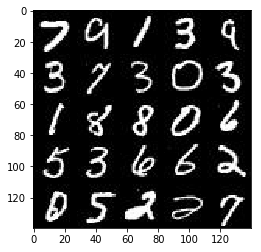

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

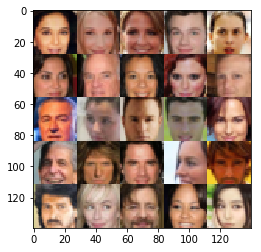

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_inputs = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name="input_real")
    z_inputs = tf.placeholder(tf.float32, (None, z_dim), name="input_z")
    learning_rate = tf.placeholder(tf.float32, name="learning_rate")

    return real_inputs, z_inputs, learning_rate

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    out_dim = 1
    for d in images.shape[1:]:
        out_dim = out_dim * int(d)
        
    with tf.variable_scope("discriminator", reuse=reuse):
        hidden = tf.layers.dense(images, 128, activation=None)
        hidden = tf.maximum(hidden * 0.01, hidden)
        flattened = tf.reshape(hidden,(-1, out_dim))
        logits = tf.layers.dense(flattened, 1, activation=None)        
        output = tf.sigmoid(logits)

    return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse = (is_train == False)):
        hidden = tf.layers.dense(z, 128, activation=None)
        hidden = tf.maximum(0.01 * hidden, hidden)
        
        # Logits and tanh output
        logits = tf.layers.dense(hidden, 28*28*out_channel_dim, activation=None)
        out = tf.tanh(logits)
        out = tf.reshape(out,(-1,28,28,out_channel_dim))        
        return out    
    return None


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim, is_train=True)
    _, d_logits_real = discriminator(input_real, reuse=False)
    _, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(
                  tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, 
                                                          labels=tf.ones_like(d_logits_real) * 0.9))
    d_loss_fake = tf.reduce_mean(
                  tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                                          labels=tf.zeros_like(d_logits_real)))
    d_loss = d_loss_real + d_loss_fake

    g_loss = tf.reduce_mean(
             tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                     labels=tf.ones_like(d_logits_fake)))
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]

    d_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    g_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate_param, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    #tf.reset_default_graph()
    out_channel_dim = int(data_shape[3])
    input_real, input_z, learning_rate = model_inputs(int(data_shape[1]), int(data_shape[2]), out_channel_dim, z_dim)
    print("Real Inputs: {} {}".format(input_real.name, input_real.shape))
    print("Fake Inputs: {} {}".format(input_z.name, input_z.shape))
    print(learning_rate.shape)
    
    d_loss, g_loss = model_loss(input_real, input_z, out_channel_dim)
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for i, batch_images in enumerate(get_batches(batch_size)):
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_train_opt, feed_dict={input_z: batch_z, input_real: batch_images, learning_rate: learning_rate_param})
                _ = sess.run(g_train_opt, feed_dict={input_z: batch_z, learning_rate: learning_rate_param})
                
                print("Batch {}".format(i))
                show_generator_output(sess, 9, input_z, out_channel_dim, data_image_mode)
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Real Inputs: input_real:0 (?, 28, 28, 1)
Fake Inputs: input_z:0 (?, 100)
<unknown>
Batch 0


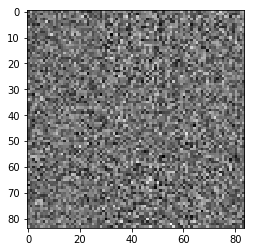

Batch 1


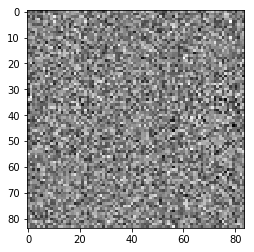

Batch 2


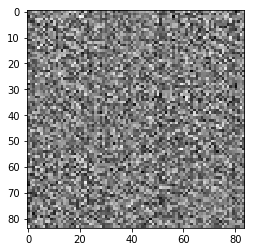

Batch 3


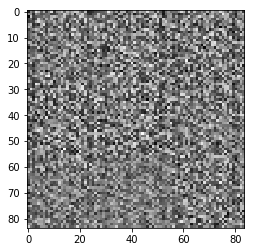

Batch 4


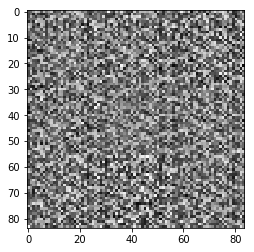

Batch 5


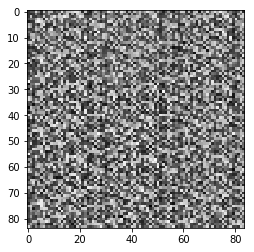

Batch 6


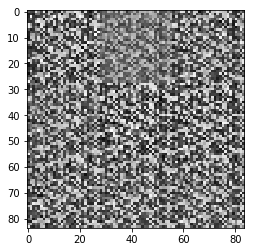

Batch 7


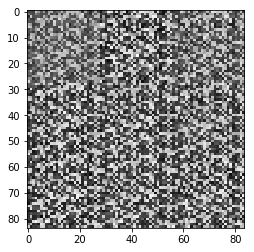

Batch 8


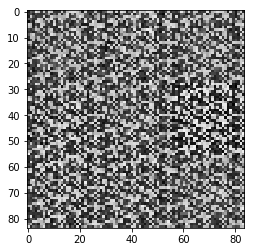

Batch 9


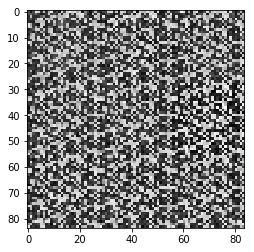

Batch 10


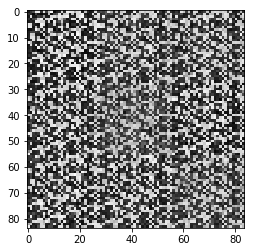

Batch 11


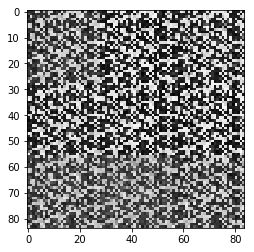

Batch 12


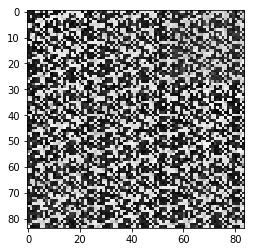

Batch 13


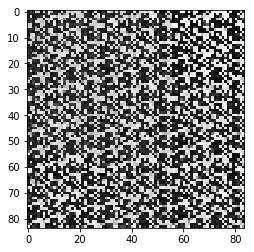

Batch 14


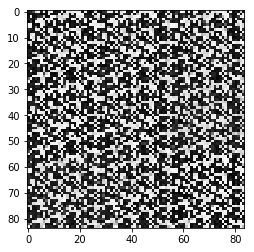

Batch 15


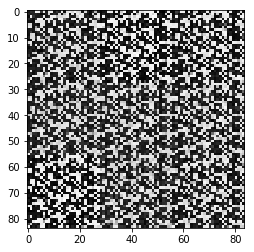

Batch 16


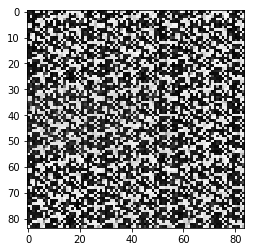

Batch 17


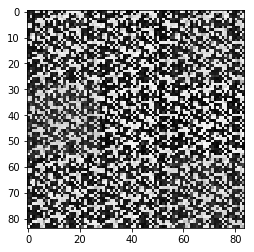

Batch 18


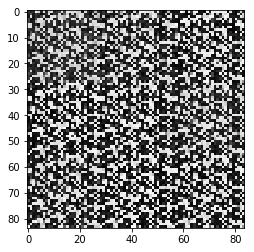

Batch 19


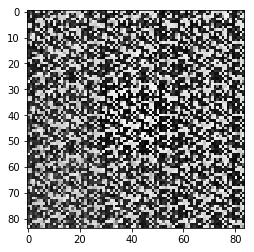

Batch 20


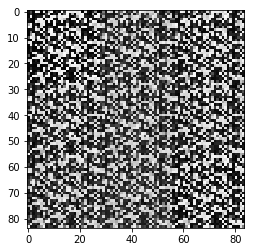

Batch 21


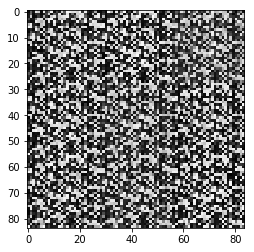

Batch 22


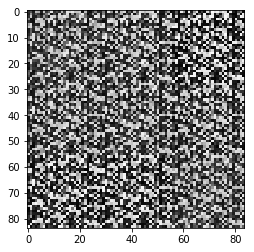

Batch 23


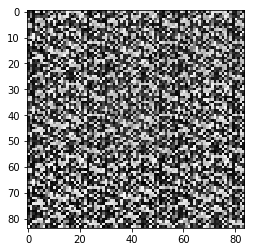

Batch 24


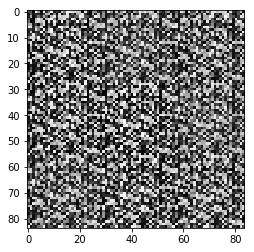

Batch 25


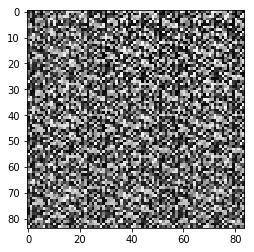

Batch 26


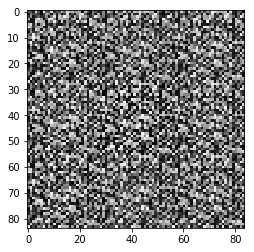

Batch 27


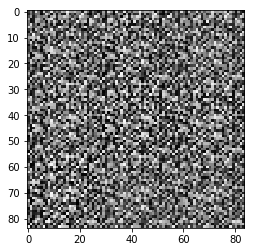

Batch 28


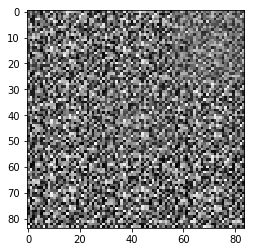

Batch 29


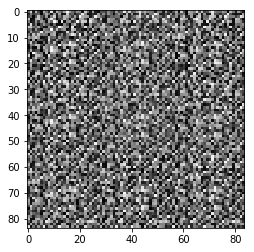

Batch 30


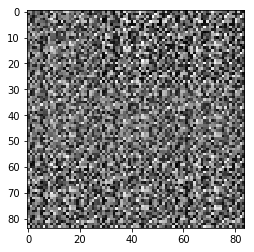

Batch 31


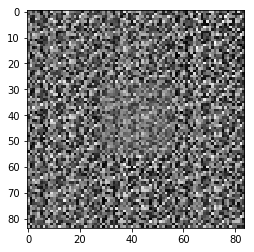

Batch 32


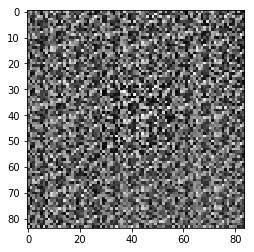

Batch 33


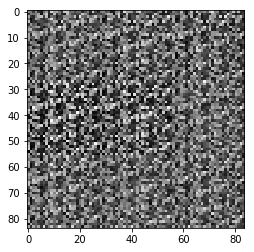

Batch 34


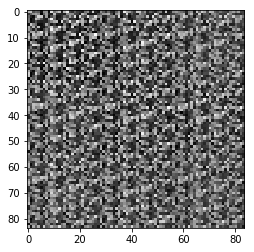

Batch 35


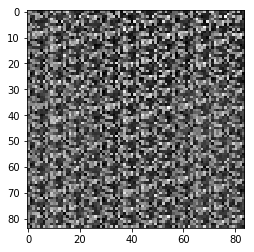

Batch 36


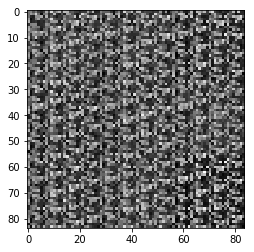

Batch 37


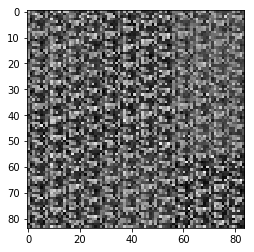

Batch 38


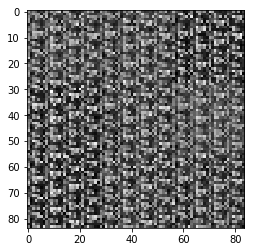

Batch 39


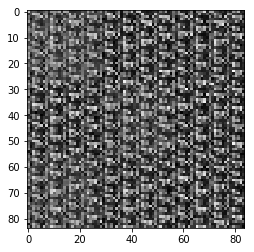

Batch 40


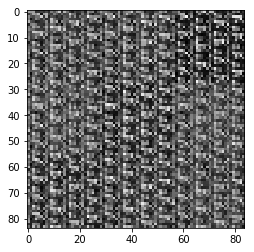

Batch 41


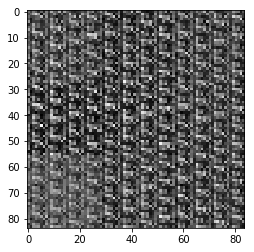

Batch 42


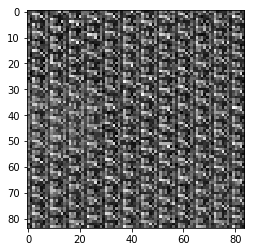

Batch 43


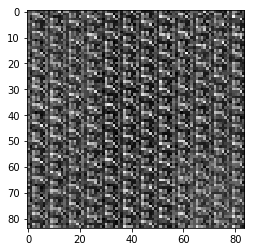

Batch 44


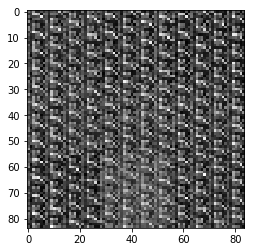

Batch 45


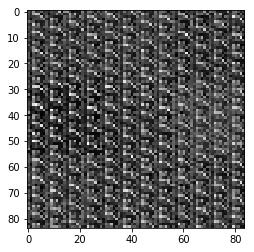

Batch 46


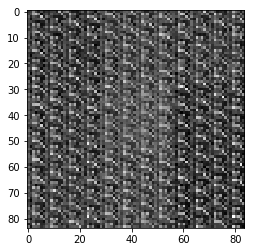

Batch 47


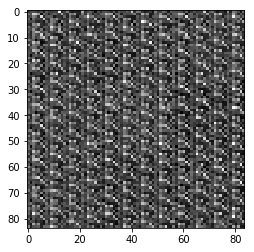

Batch 48


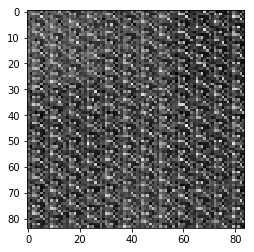

Batch 49


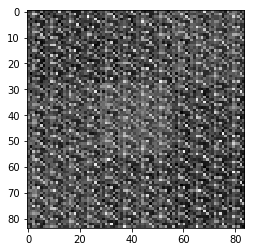

Batch 50


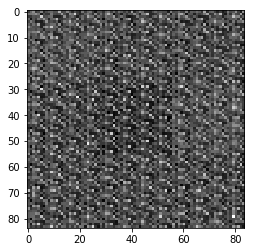

Batch 51


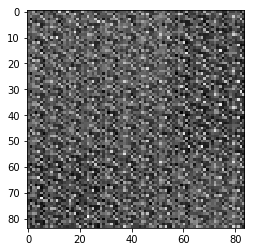

Batch 52


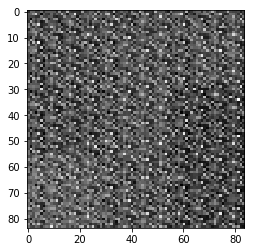

Batch 53


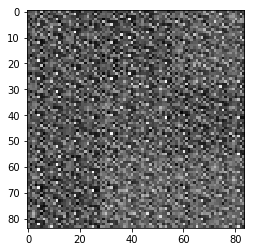

Batch 54


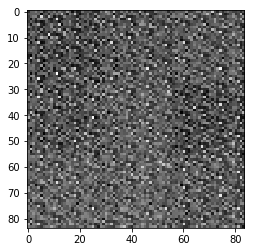

Batch 55


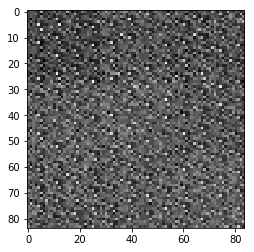

Batch 56


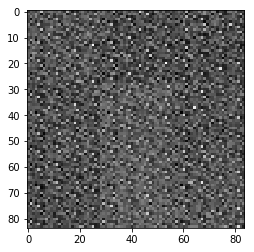

Batch 57


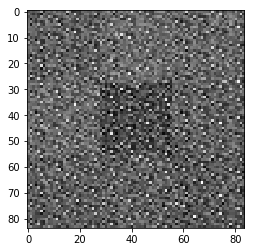

Batch 58


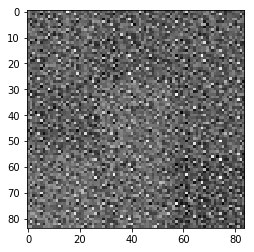

Batch 59


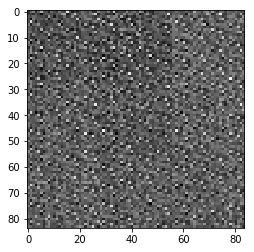

Batch 60


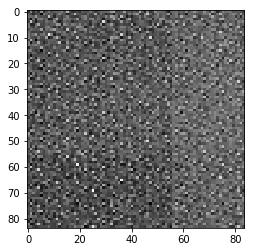

Batch 61


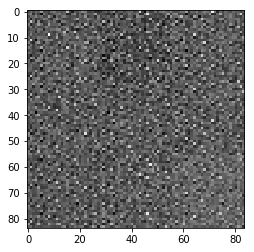

Batch 62


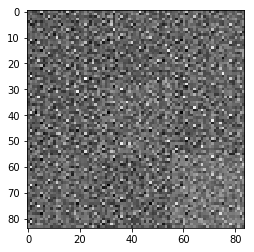

Batch 63


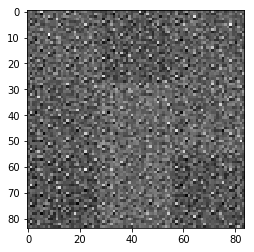

Batch 64


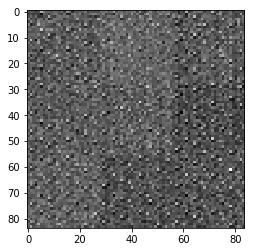

Batch 65


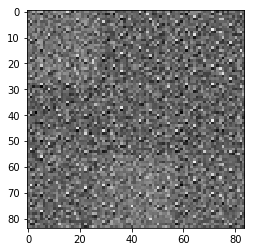

Batch 66


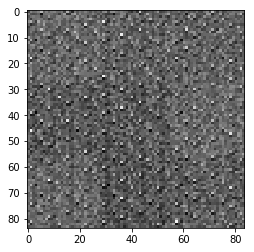

Batch 67


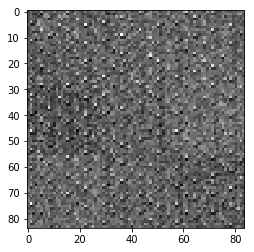

Batch 68


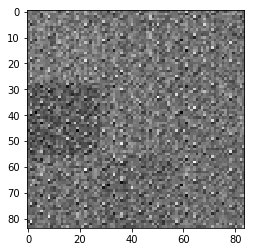

Batch 69


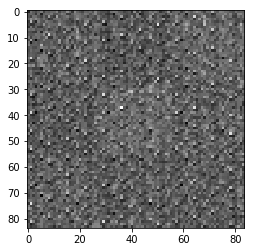

Batch 70


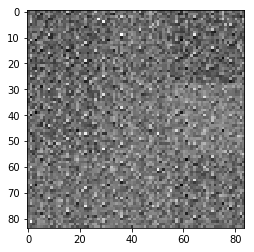

Batch 71


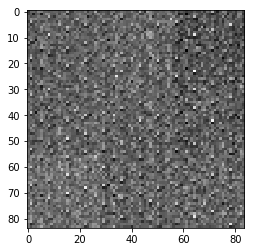

Batch 72


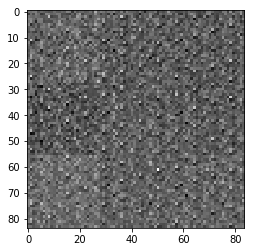

Batch 73


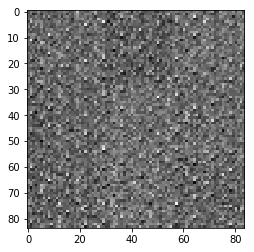

Batch 74


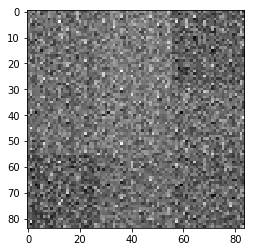

Batch 75


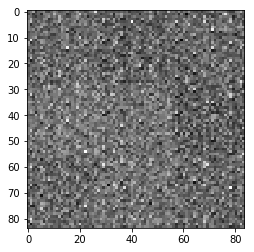

Batch 76


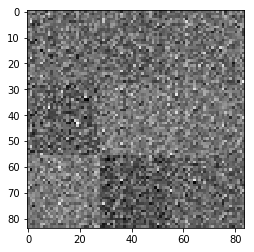

Batch 77


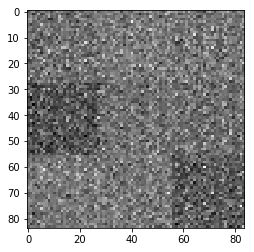

Batch 78


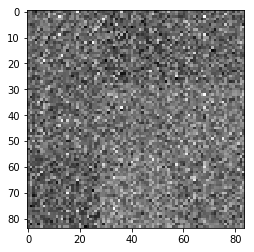

Batch 79


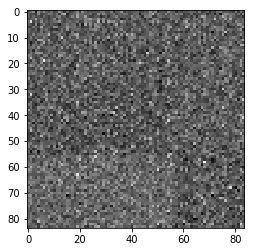

Batch 80


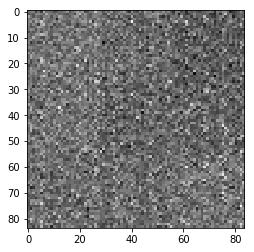

Batch 81


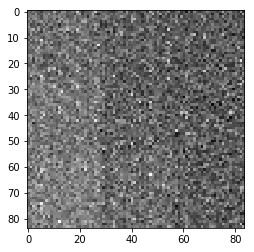

Batch 82


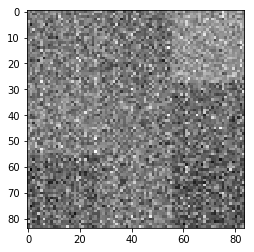

Batch 83


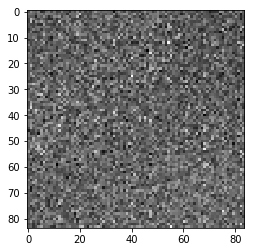

Batch 84


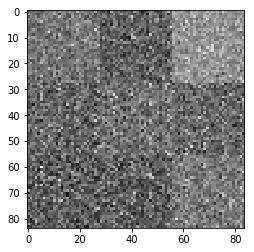

Batch 85


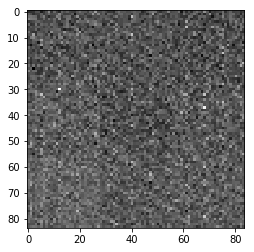

Batch 86


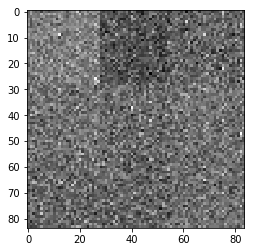

Batch 87


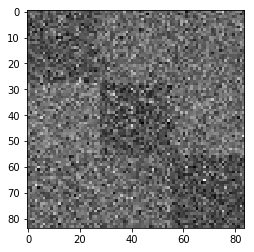

Batch 88


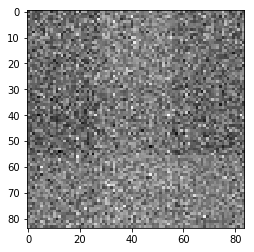

Batch 89


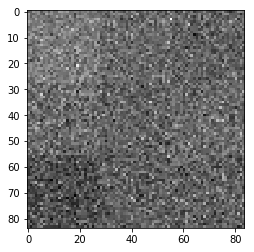

Batch 90


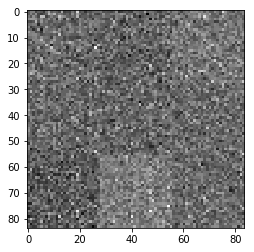

Batch 91


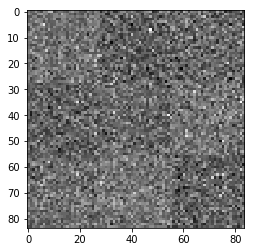

Batch 92


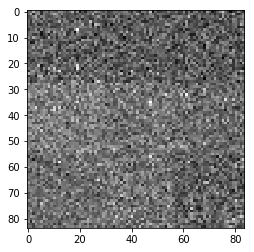

Batch 93


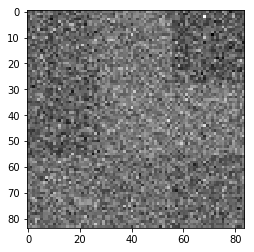

Batch 94


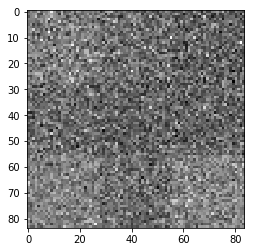

Batch 95


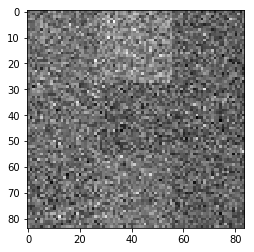

Batch 96


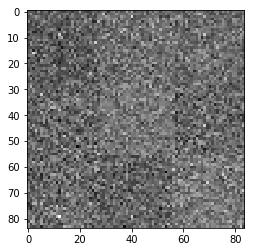

Batch 97


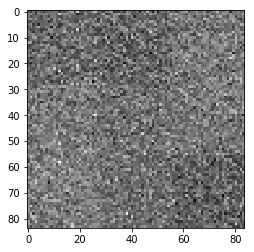

Batch 98


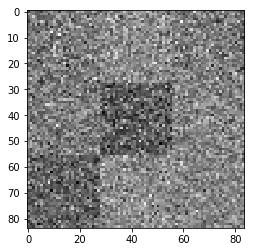

Batch 99


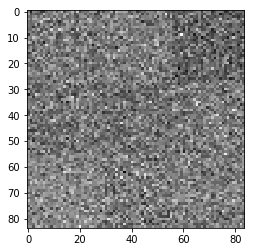

Batch 100


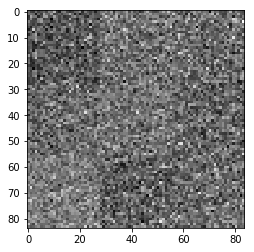

Batch 101


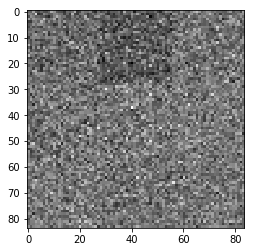

Batch 102


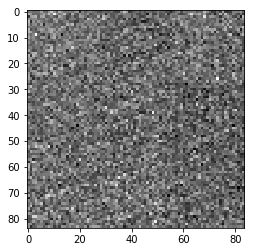

Batch 103


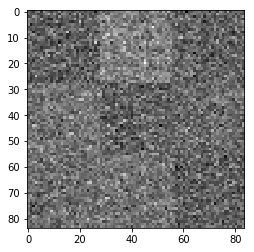

Batch 104


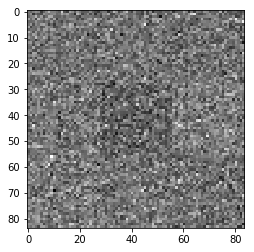

Batch 105


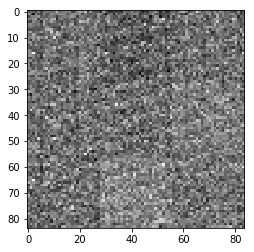

Batch 106


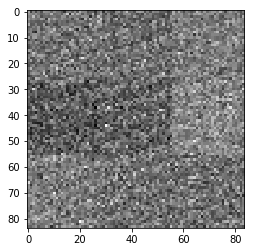

Batch 107


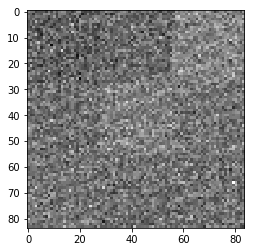

Batch 108


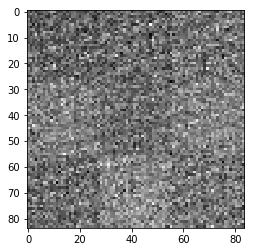

Batch 109


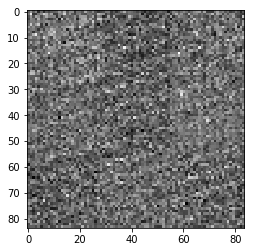

Batch 110


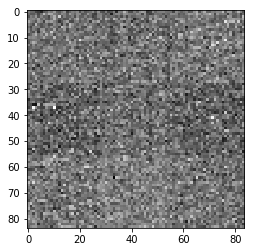

Batch 111


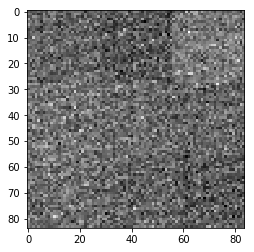

Batch 112


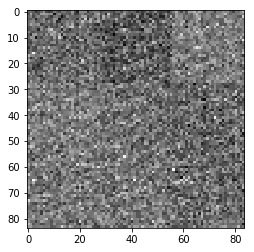

Batch 113


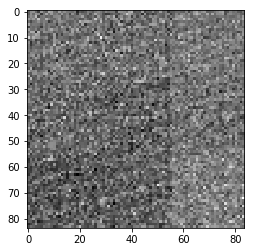

Batch 114


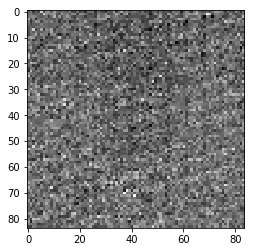

Batch 115


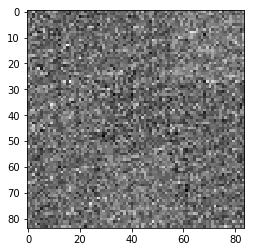

Batch 116


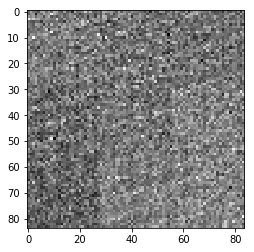

Batch 117


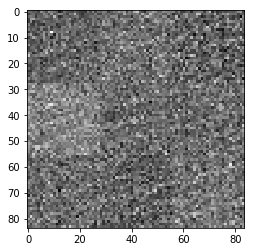

Batch 118


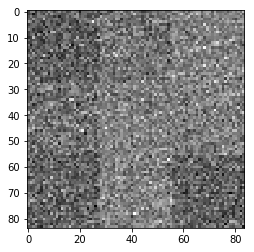

Batch 119


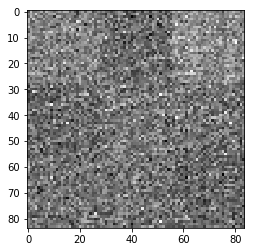

Batch 120


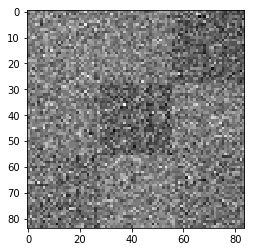

Batch 121


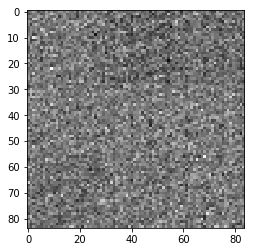

Batch 122


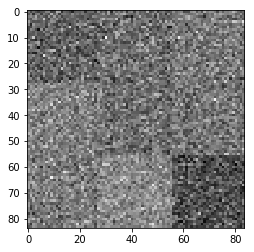

Batch 123


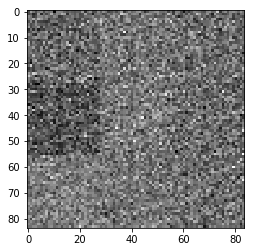

Batch 124


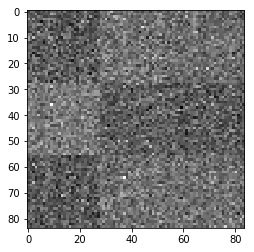

Batch 125


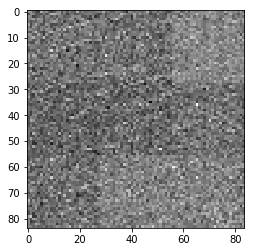

Batch 126


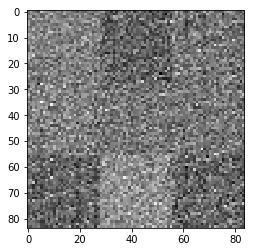

Batch 127


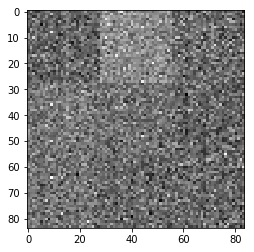

Batch 128


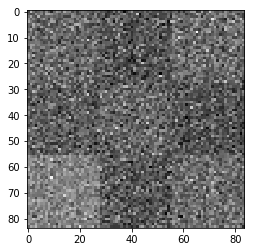

Batch 129


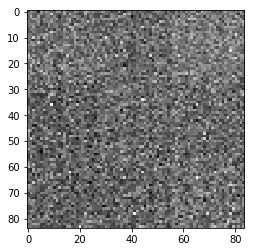

Batch 130


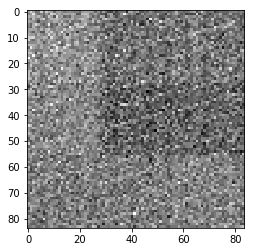

Batch 131


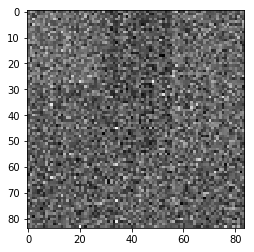

Batch 132


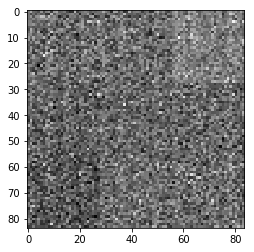

Batch 133


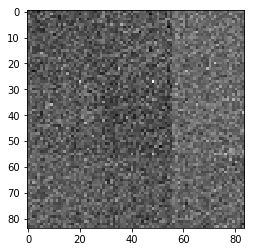

Batch 134


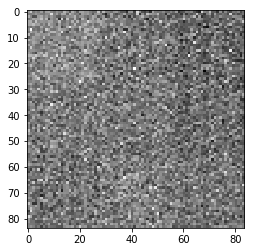

Batch 135


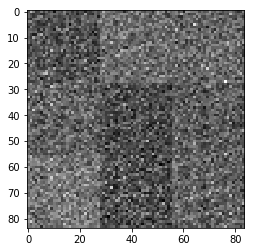

Batch 136


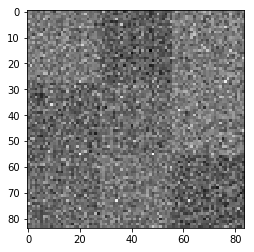

Batch 137


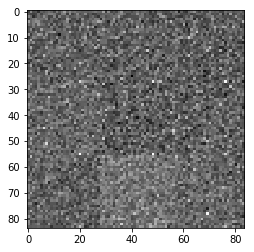

Batch 138


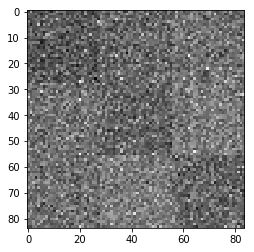

Batch 139


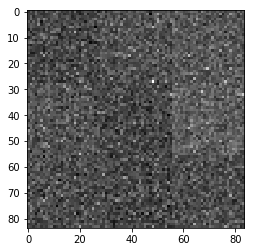

Batch 140


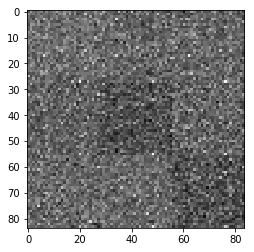

Batch 141


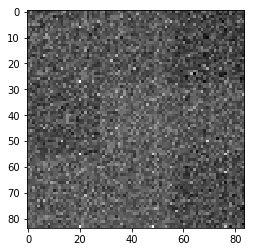

Batch 142


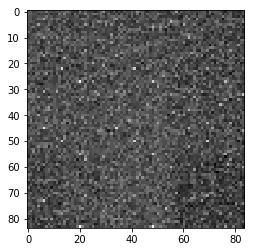

Batch 143


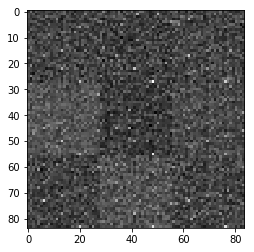

Batch 144


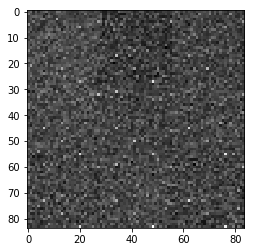

Batch 145


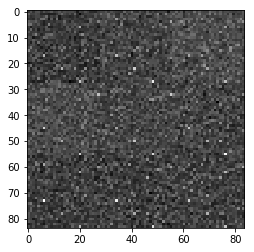

Batch 146


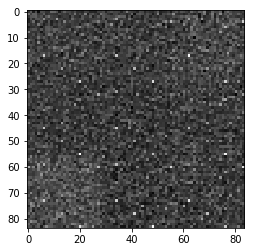

Batch 147


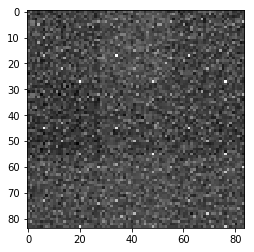

Batch 148


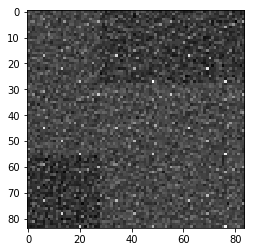

Batch 149


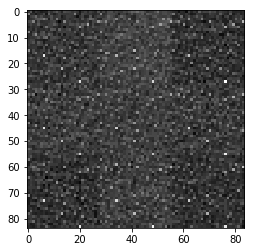

Batch 150


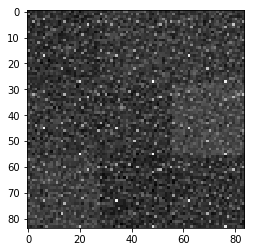

Batch 151


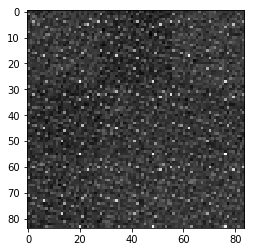

Batch 152


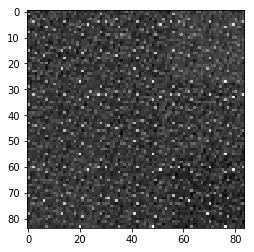

Batch 153


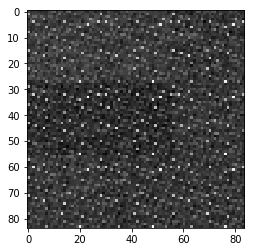

Batch 154


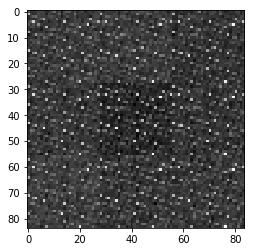

Batch 155


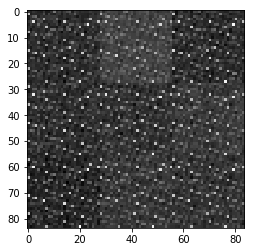

Batch 156


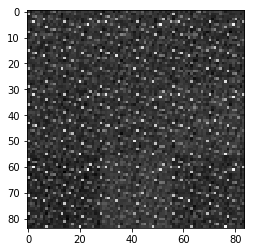

Batch 157


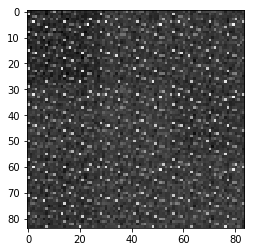

Batch 158


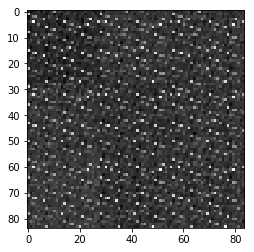

Batch 159


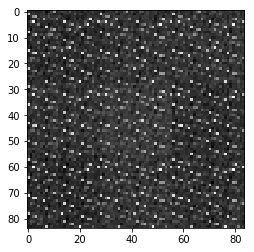

Batch 160


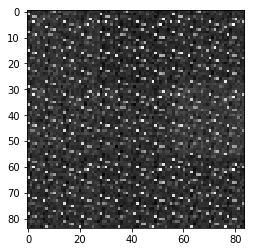

Batch 161


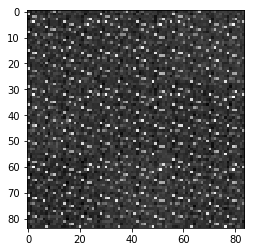

Batch 162


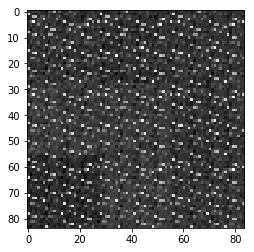

Batch 163


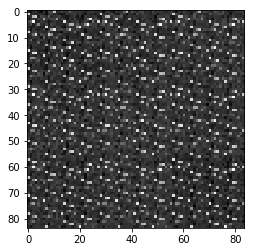

Batch 164


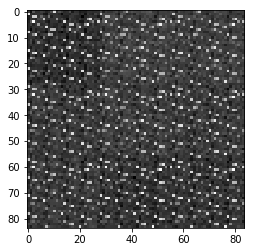

Batch 165


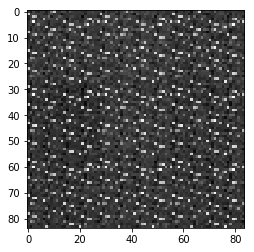

Batch 166


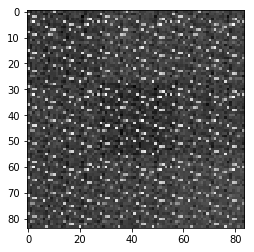

Batch 167


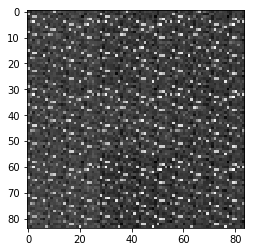

Batch 168


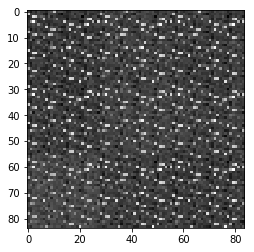

Batch 169


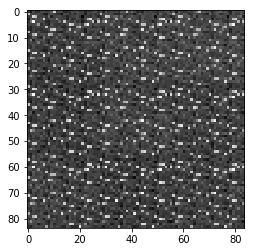

Batch 170


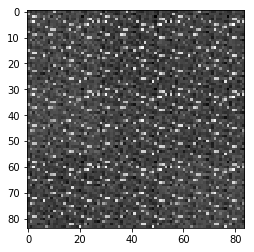

Batch 171


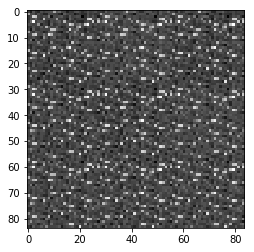

Batch 172


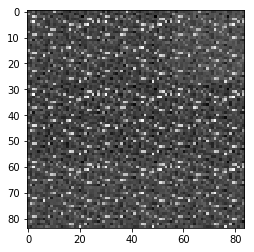

Batch 173


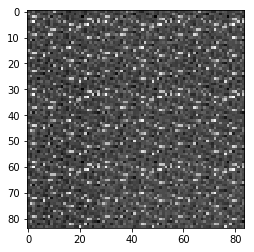

Batch 174


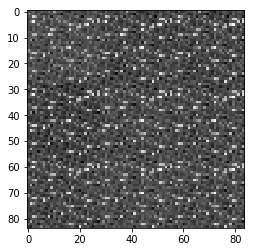

Batch 175


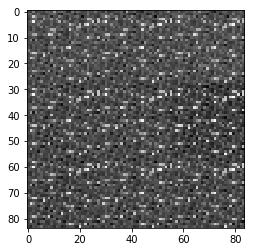

Batch 176


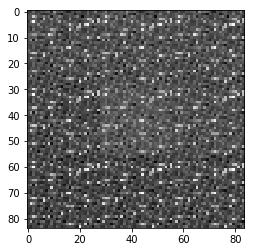

Batch 177


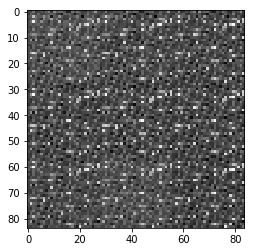

Batch 178


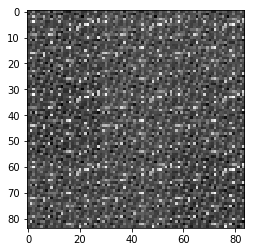

Batch 179


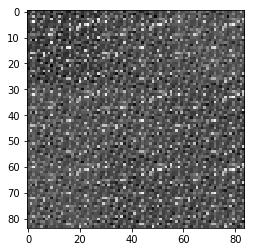

Batch 180


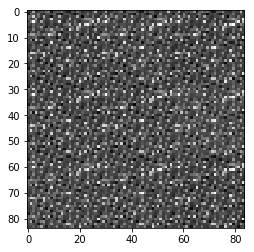

Batch 181


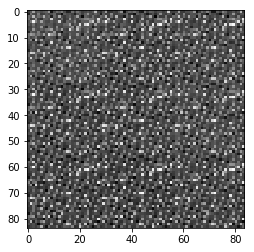

Batch 182


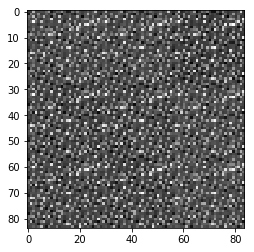

Batch 183


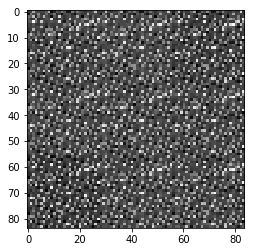

Batch 184


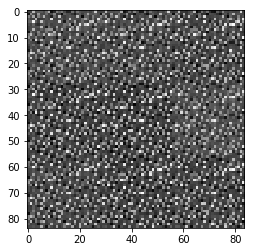

Batch 185


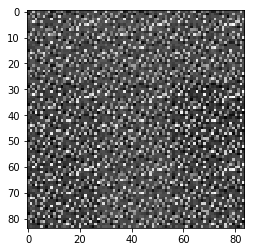

Batch 186


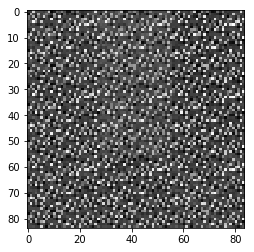

Batch 187


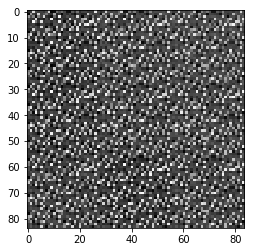

Batch 188


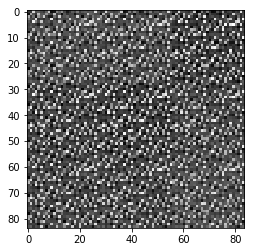

Batch 189


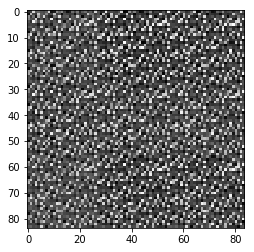

Batch 190


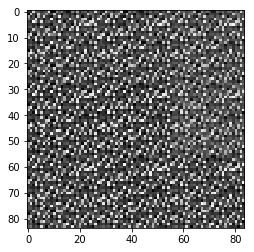

Batch 191


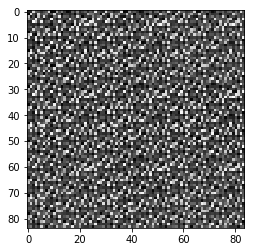

Batch 192


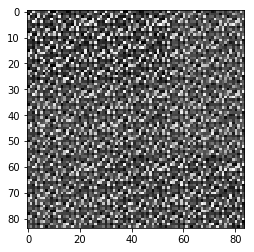

Batch 193


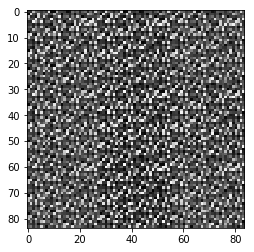

Batch 194


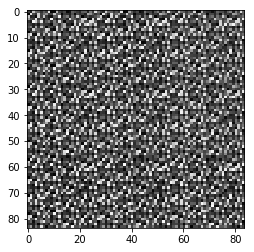

Batch 195


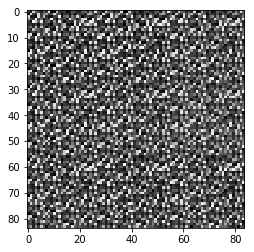

Batch 196


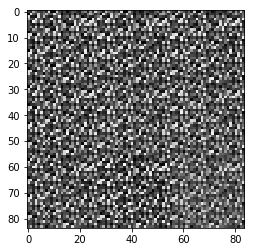

Batch 197


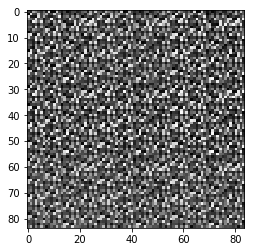

Batch 198


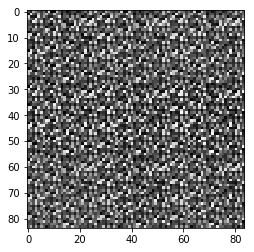

Batch 199


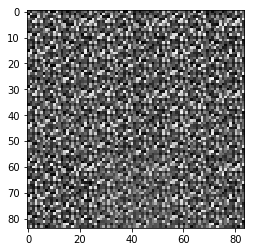

Batch 200


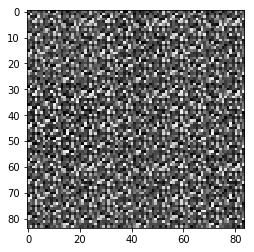

Batch 201


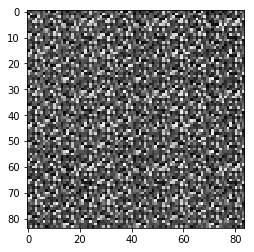

Batch 202


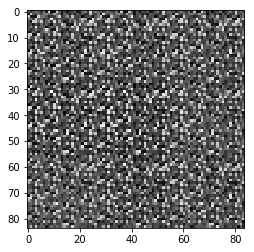

Batch 203


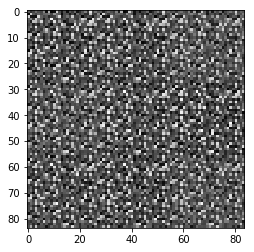

Batch 204


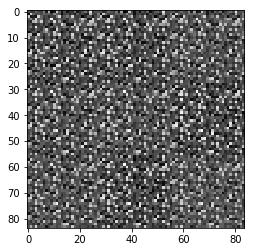

Batch 205


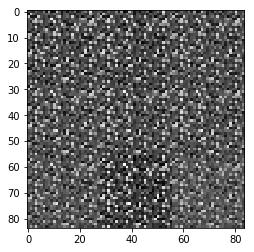

Batch 206


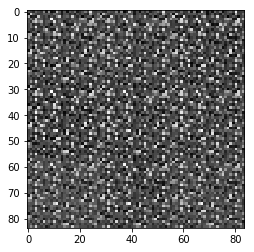

Batch 207


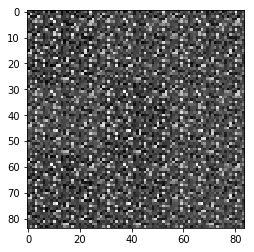

Batch 208


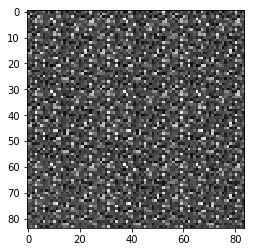

Batch 209


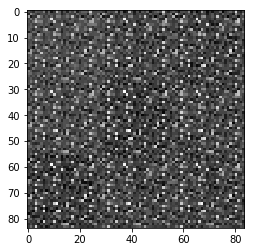

Batch 210


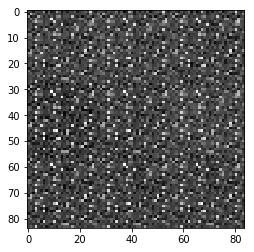

Batch 211


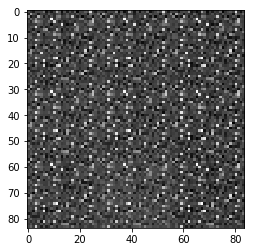

Batch 212


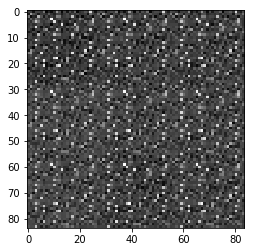

Batch 213


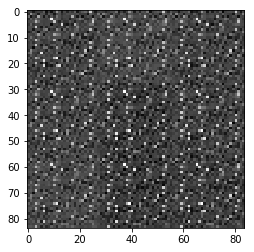

Batch 214


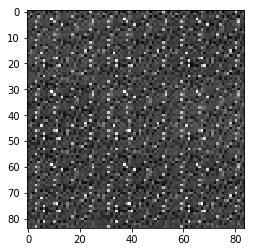

Batch 215


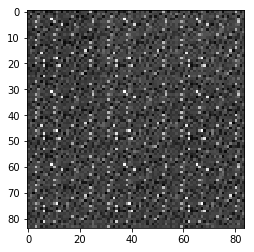

Batch 216


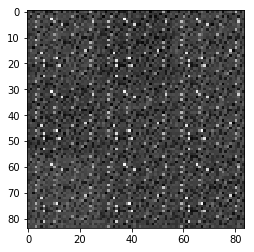

Batch 217


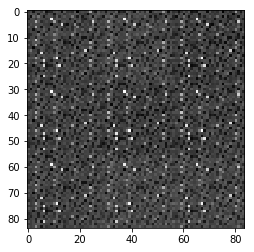

Batch 218


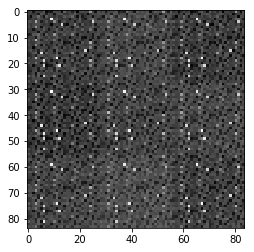

Batch 219


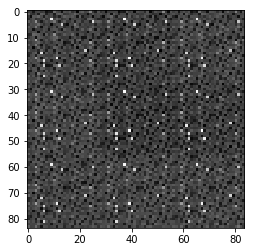

Batch 220


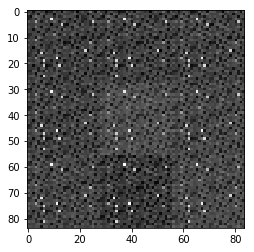

Batch 221


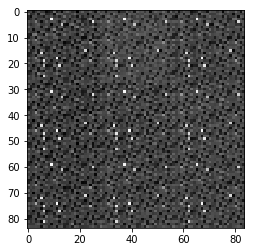

Batch 222


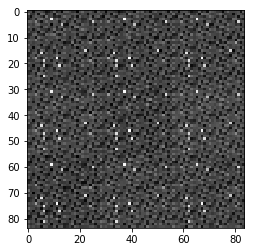

Batch 223


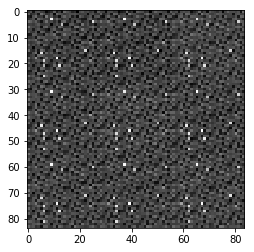

Batch 224


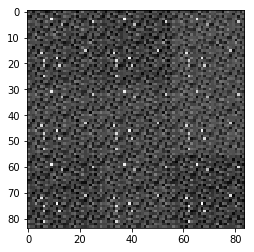

Batch 225


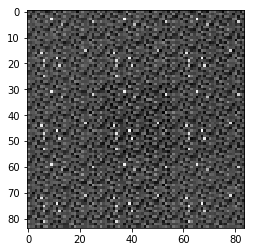

Batch 226


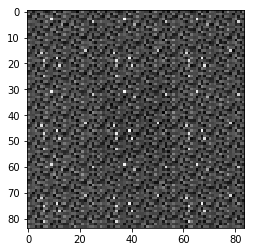

Batch 227


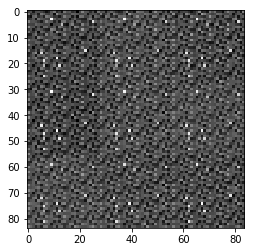

Batch 228


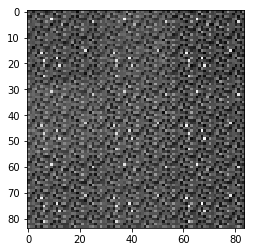

Batch 229


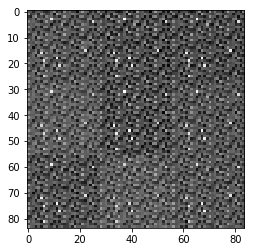

Batch 230


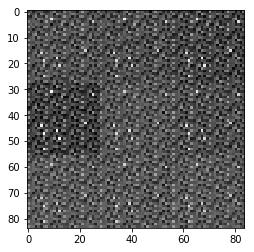

Batch 231


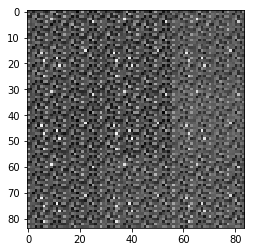

Batch 232


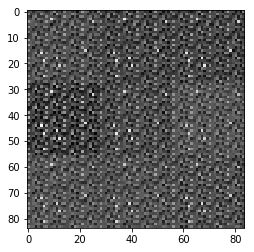

Batch 233


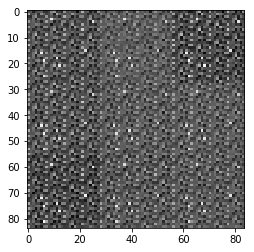

Batch 234


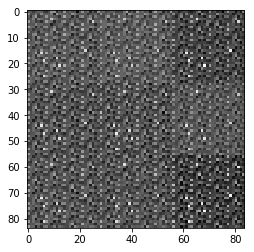

Batch 235


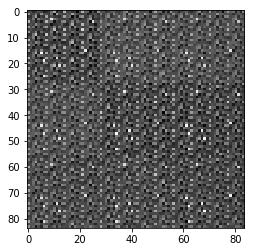

Batch 236


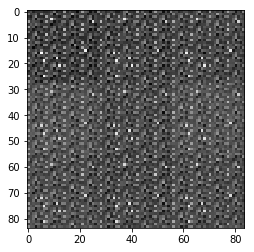

Batch 237


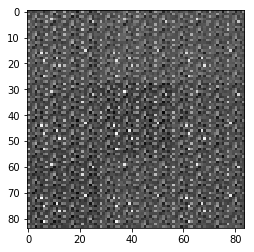

Batch 238


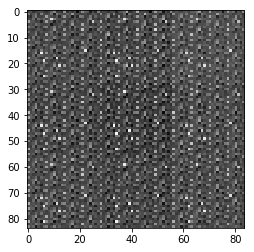

Batch 239


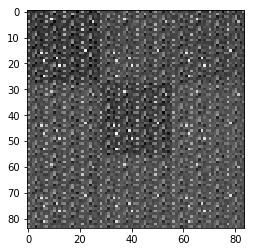

Batch 240


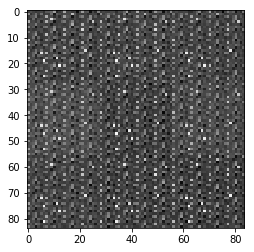

Batch 241


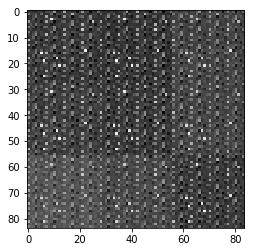

Batch 242


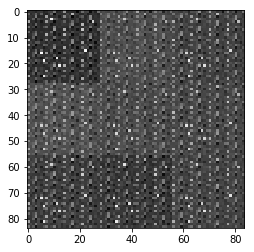

Batch 243


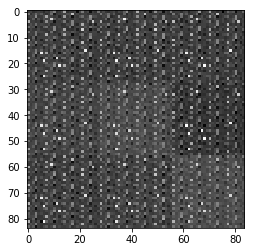

Batch 244


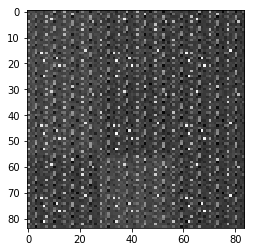

Batch 245


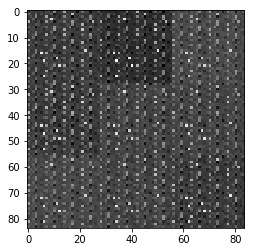

Batch 246


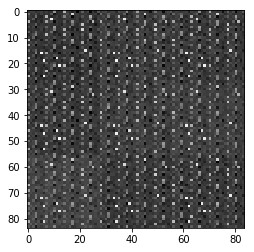

Batch 247


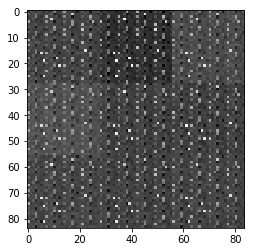

Batch 248


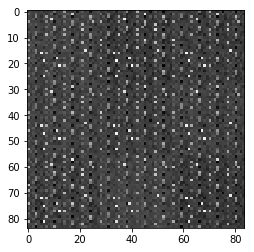

Batch 249


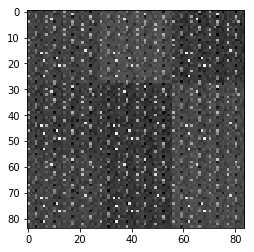

Batch 250


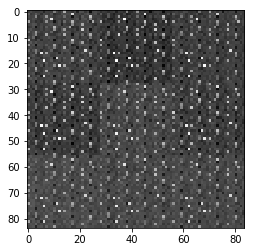

Batch 251


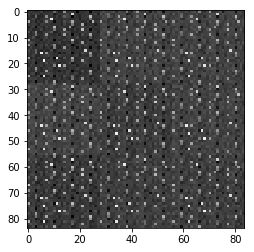

Batch 252


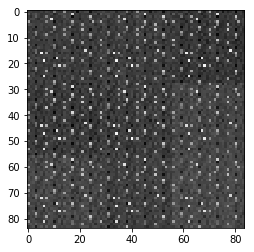

Batch 253


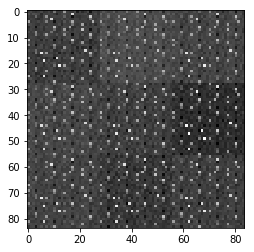

Batch 254


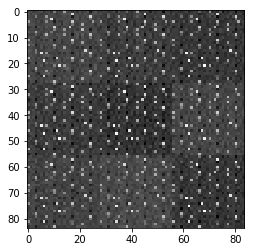

Batch 255


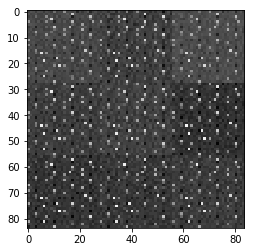

Batch 256


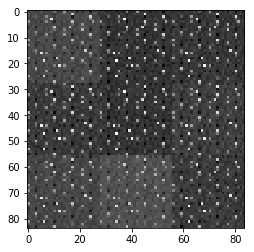

Batch 257


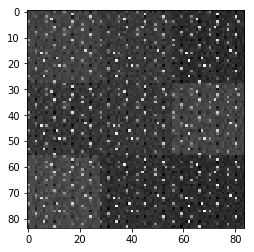

Batch 258


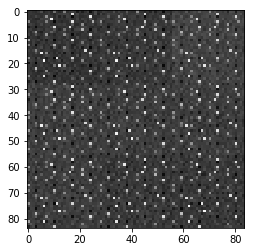

Batch 259


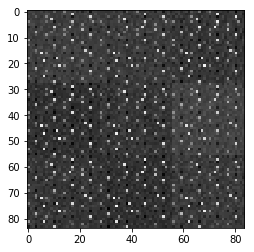

Batch 260


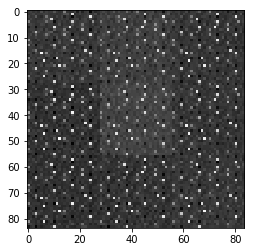

Batch 261


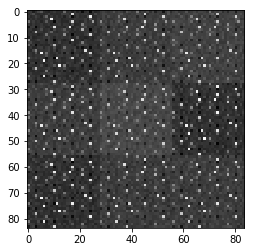

Batch 262


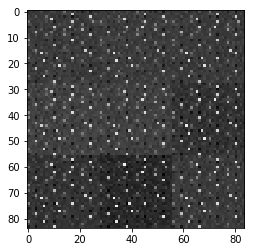

Batch 263


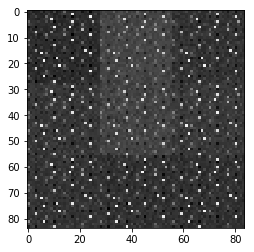

Batch 264


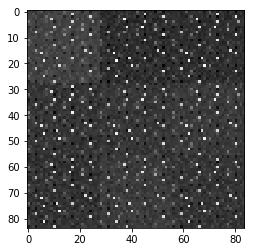

Batch 265


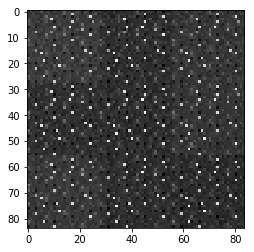

Batch 266


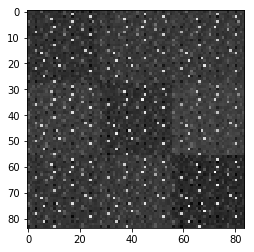

Batch 267


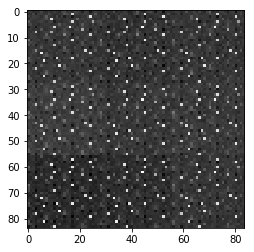

Batch 268


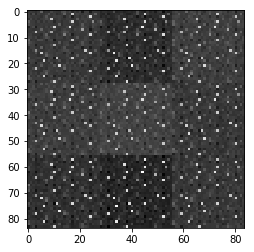

Batch 269


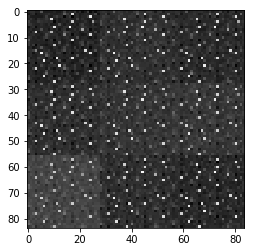

Batch 270


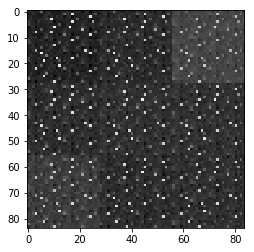

Batch 271


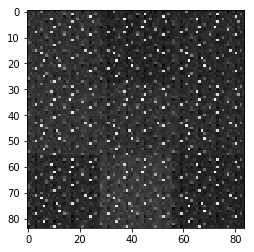

Batch 272


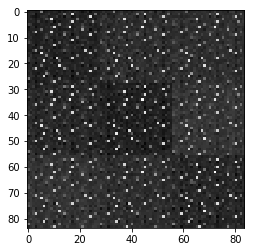

Batch 273


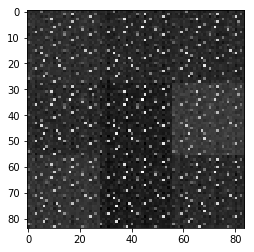

Batch 274


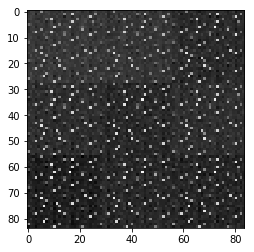

Batch 275


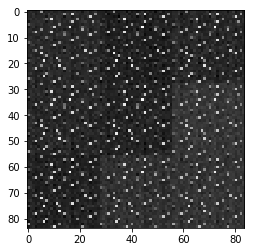

Batch 276


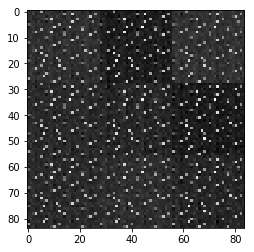

Batch 277


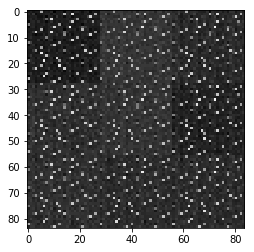

Batch 278


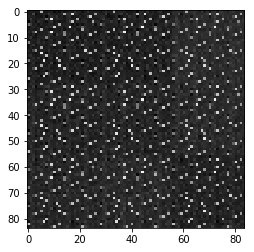

Batch 279


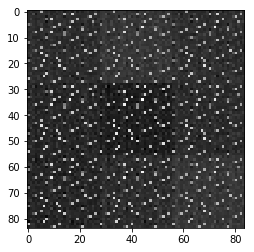

Batch 280


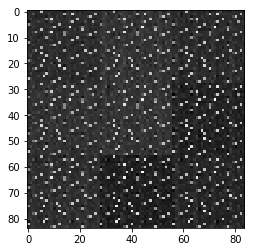

Batch 281


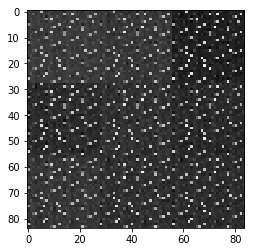

Batch 282


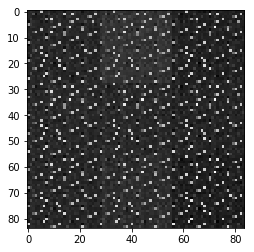

Batch 283


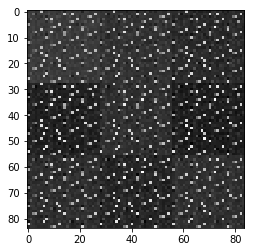

Batch 284


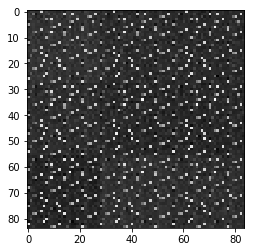

Batch 285


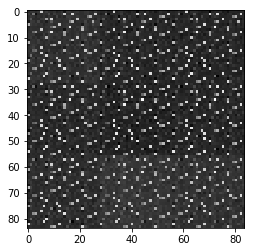

Batch 286


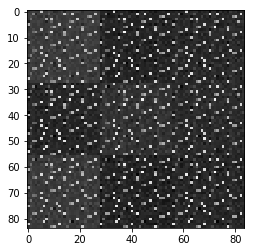

Batch 287


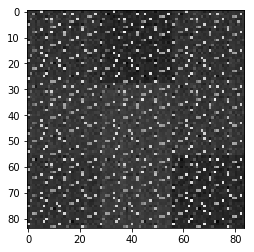

Batch 288


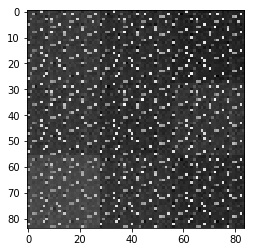

Batch 289


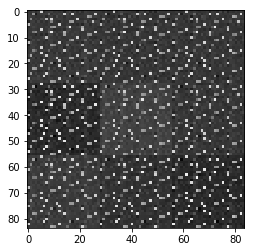

Batch 290


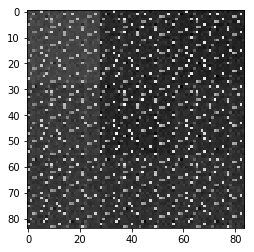

Batch 291


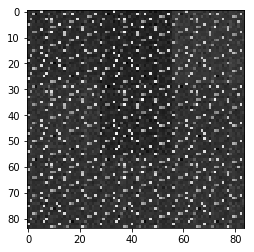

Batch 292


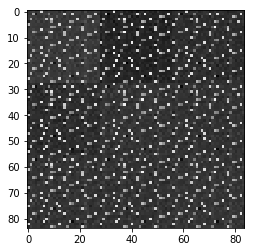

Batch 293


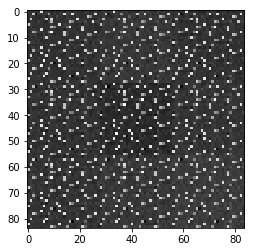

Batch 294


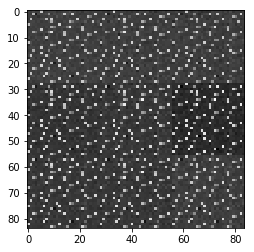

Batch 295


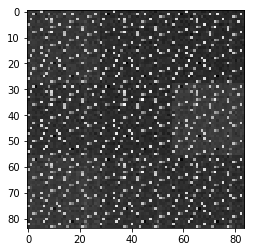

Batch 296


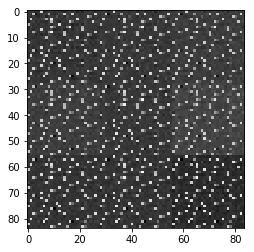

Batch 297


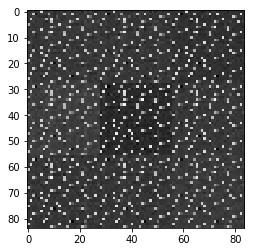

Batch 298


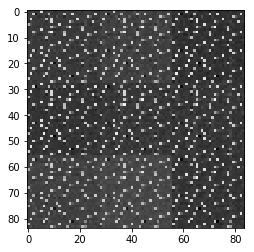

Batch 299


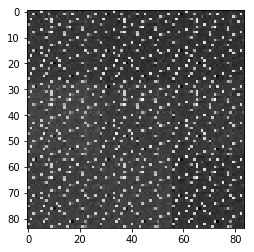

Batch 300


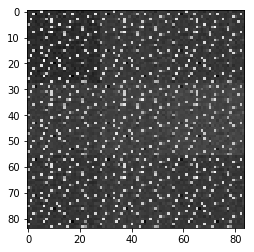

Batch 301


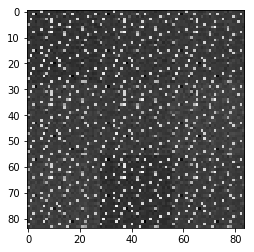

Batch 302


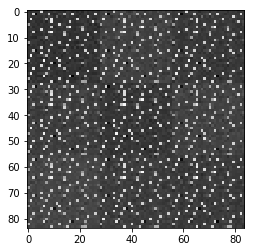

Batch 303


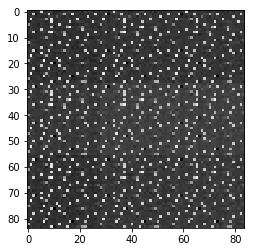

Batch 304


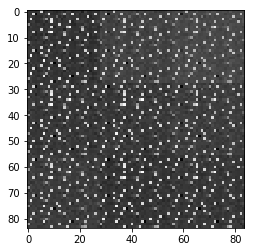

Batch 305


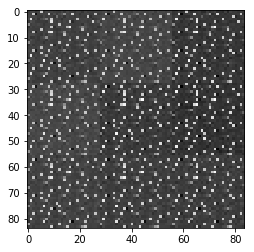

Batch 306


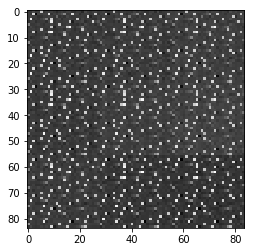

Batch 307


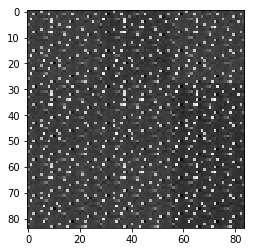

Batch 308


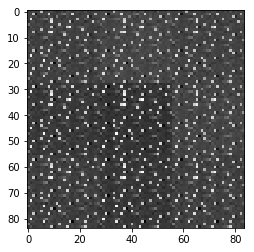

Batch 309


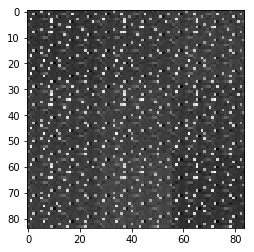

Batch 310


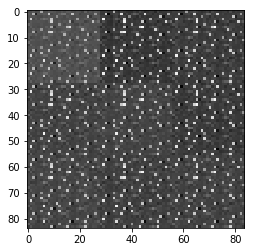

Batch 311


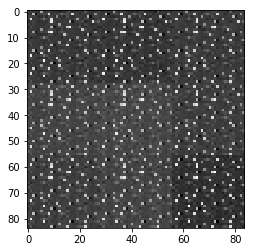

Batch 312


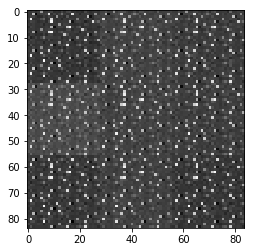

Batch 313


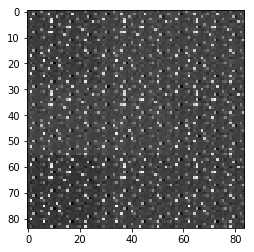

Batch 314


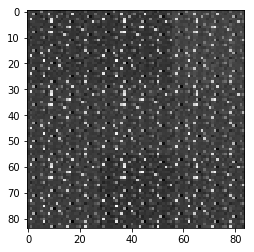

Batch 315


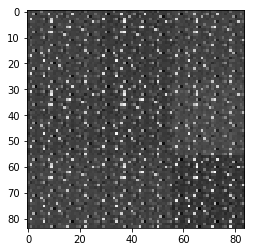

Batch 316


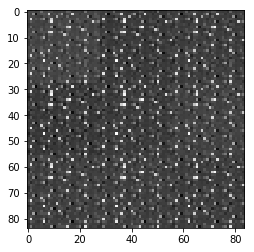

Batch 317


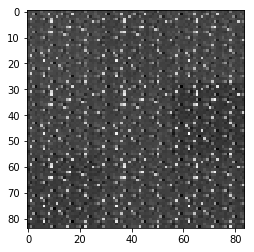

Batch 318


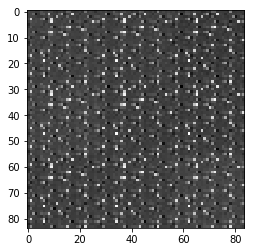

Batch 319


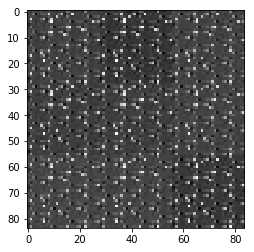

Batch 320


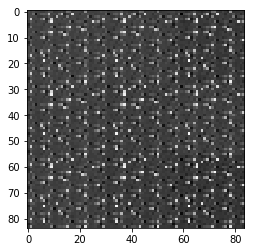

Batch 321


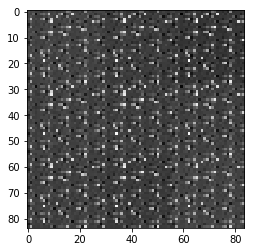

Batch 322


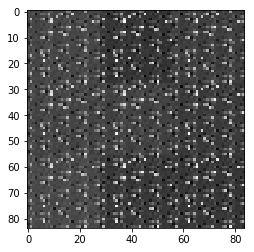

Batch 323


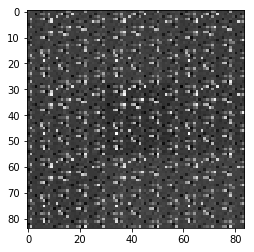

Batch 324


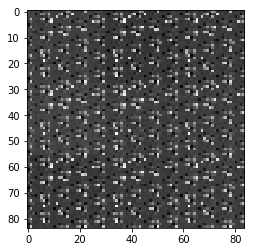

Batch 325


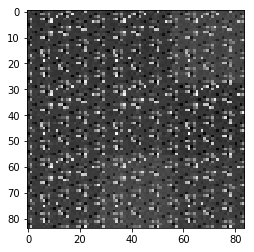

Batch 326


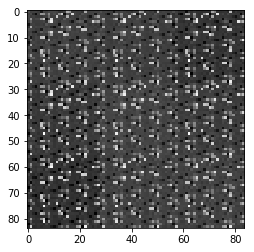

Batch 327


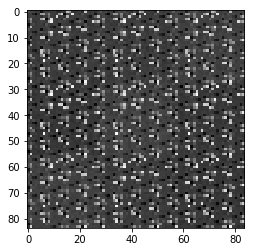

Batch 328


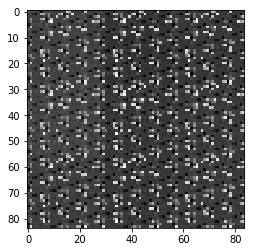

Batch 329


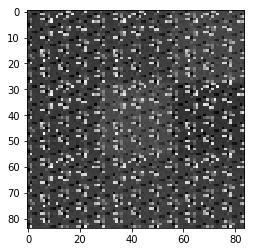

Batch 330


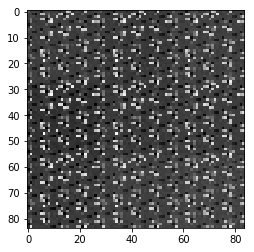

Batch 331


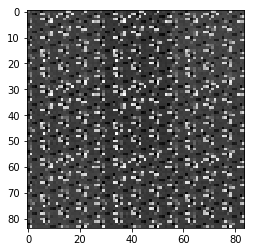

Batch 332


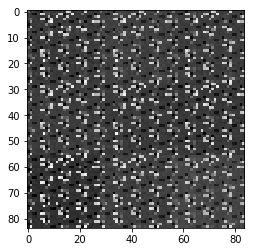

Batch 333


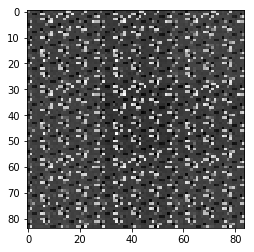

Batch 334


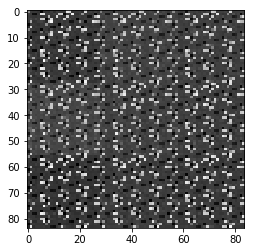

Batch 335


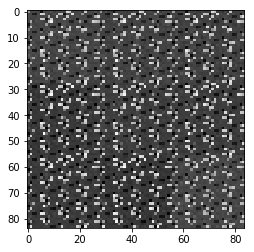

Batch 336


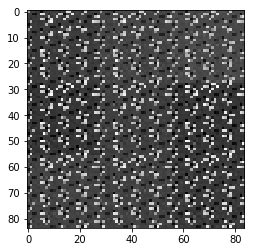

Batch 337


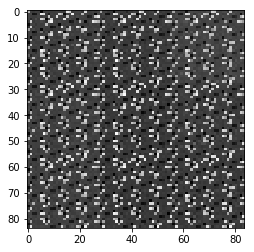

Batch 338


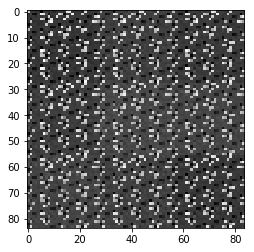

Batch 339


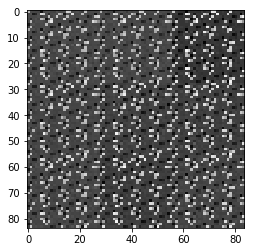

Batch 340


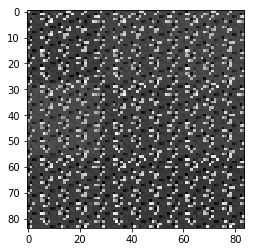

Batch 341


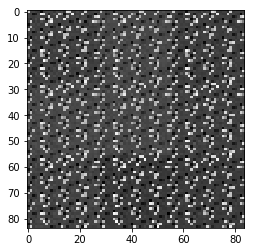

Batch 342


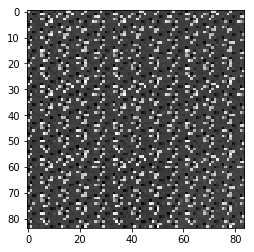

Batch 343


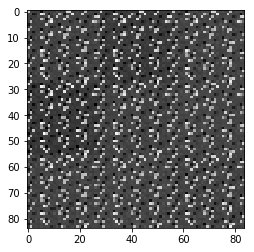

Batch 344


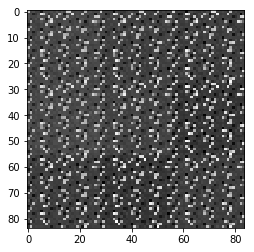

Batch 345


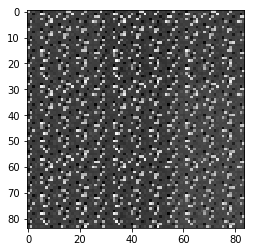

Batch 346


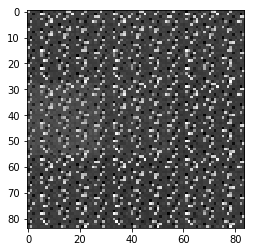

Batch 347


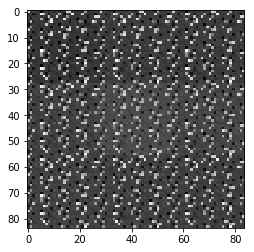

Batch 348


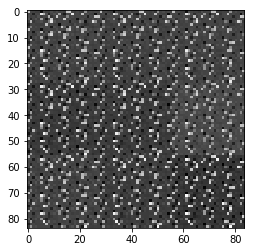

Batch 349


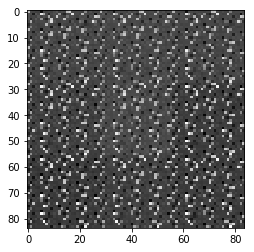

Batch 350


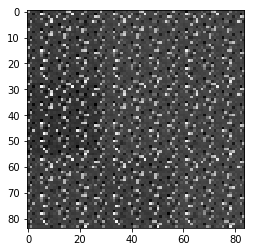

Batch 351


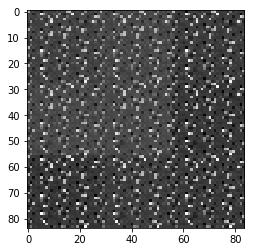

Batch 352


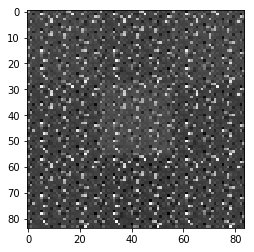

Batch 353


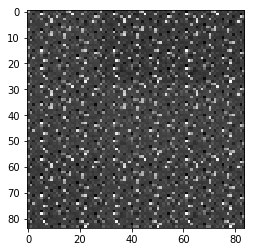

Batch 354


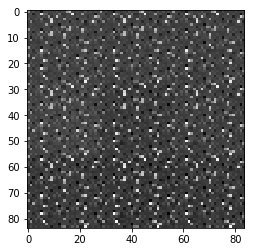

Batch 355


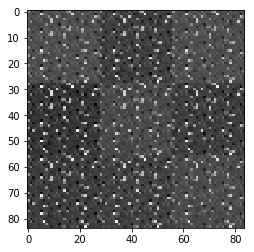

Batch 356


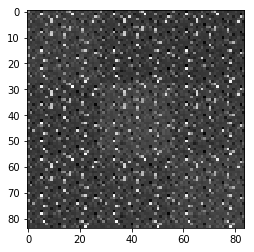

Batch 357


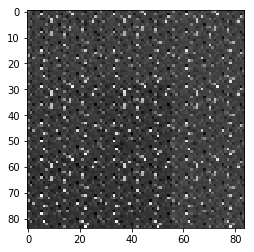

Batch 358


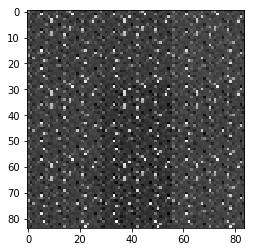

Batch 359


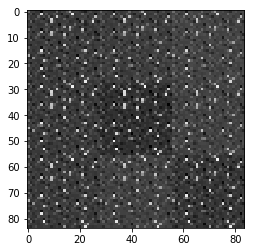

Batch 360


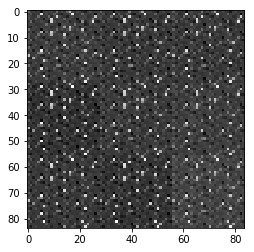

Batch 361


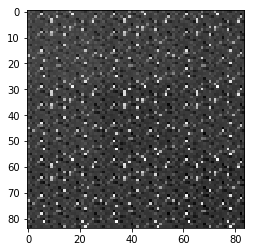

Batch 362


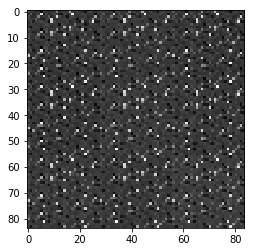

Batch 363


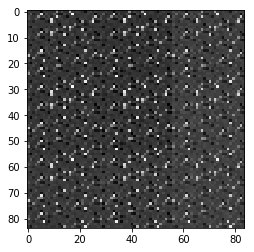

Batch 364


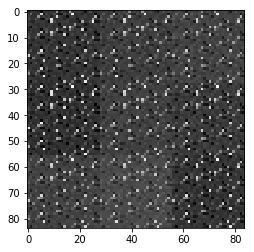

Batch 365


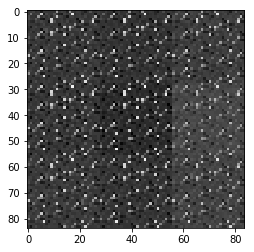

Batch 366


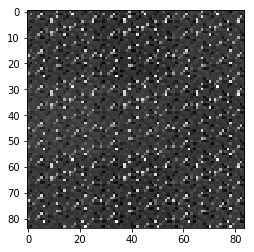

Batch 367


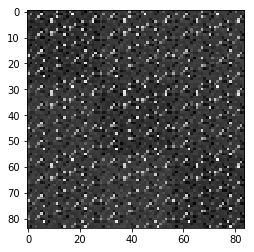

Batch 368


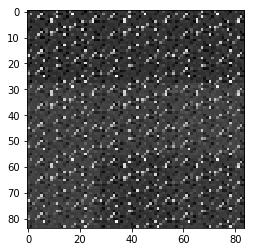

Batch 369


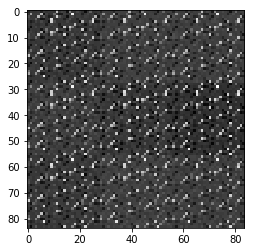

Batch 370


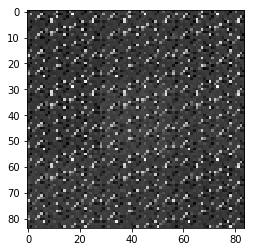

Batch 371


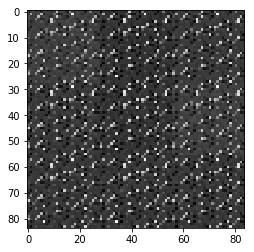

Batch 372


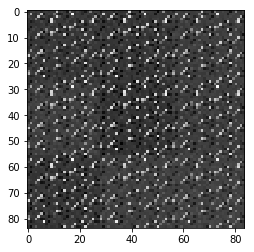

Batch 373


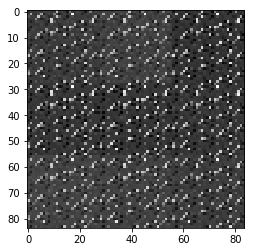

Batch 374


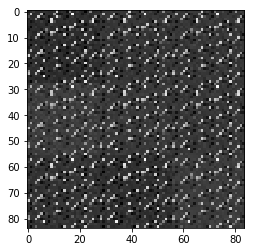

Batch 375


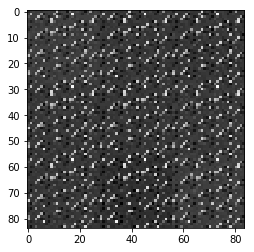

Batch 376


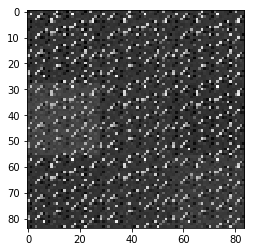

Batch 377


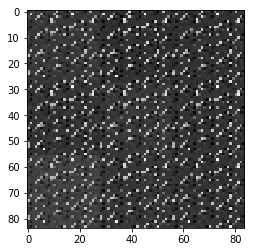

Batch 378


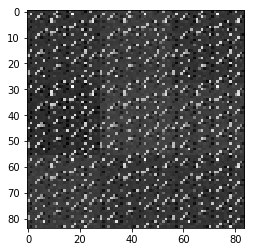

Batch 379


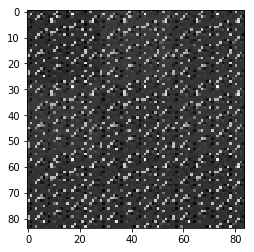

Batch 380


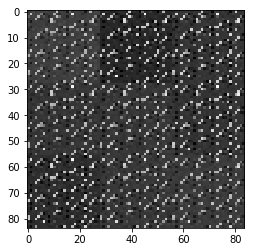

Batch 381


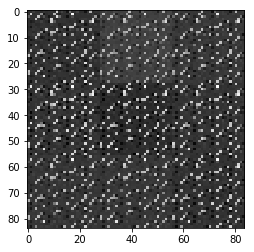

Batch 382


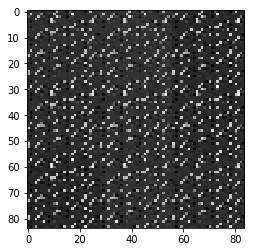

Batch 383


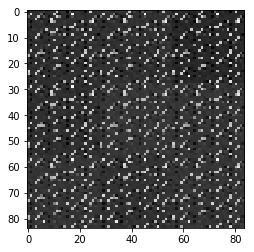

Batch 384


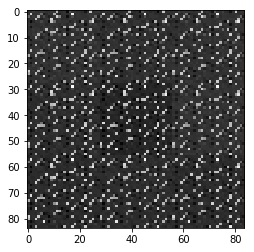

Batch 385


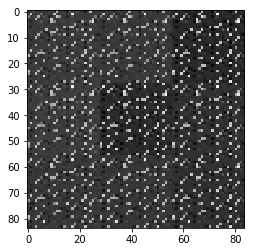

Batch 386


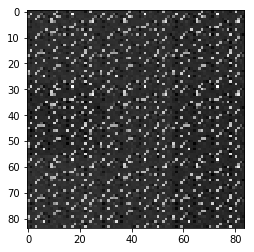

Batch 387


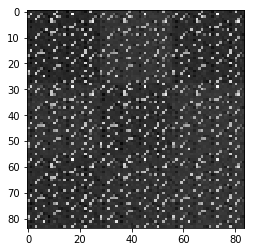

Batch 388


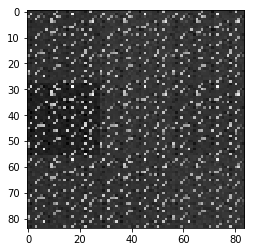

Batch 389


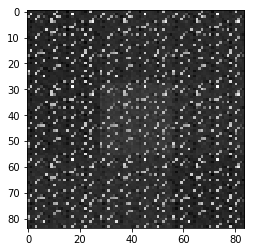

Batch 390


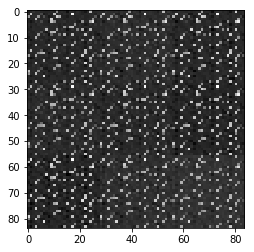

Batch 391


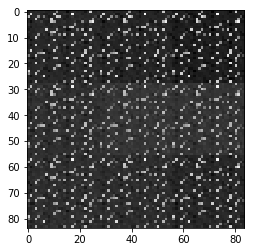

Batch 392


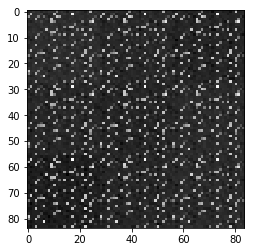

Batch 393


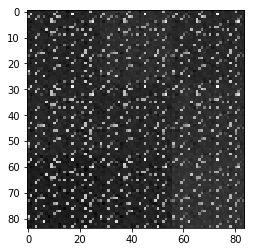

Batch 394


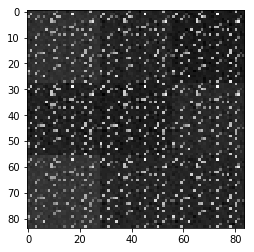

Batch 395


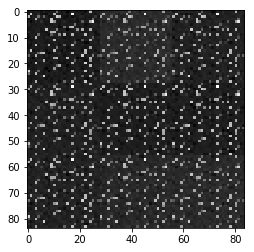

Batch 396


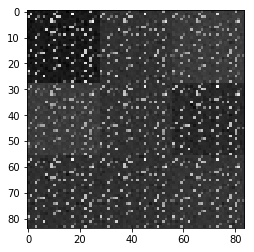

Batch 397


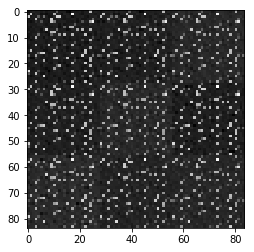

Batch 398


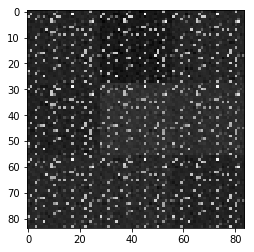

Batch 399


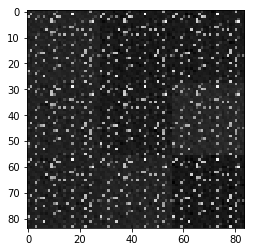

Batch 400


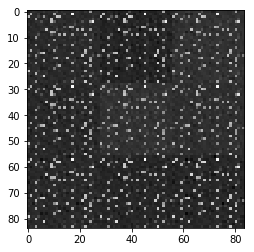

Batch 401


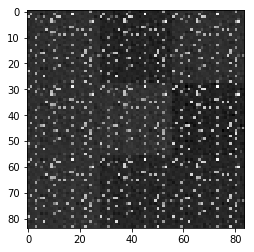

Batch 402


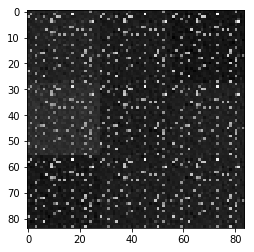

Batch 403


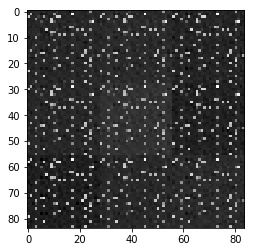

Batch 404


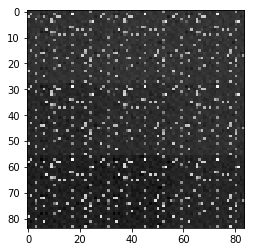

Batch 405


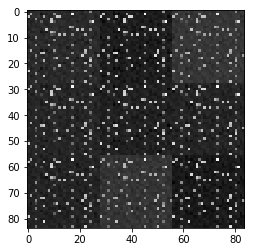

Batch 406


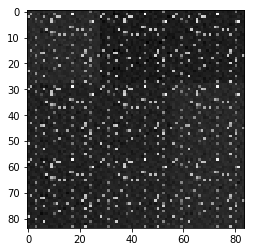

Batch 407


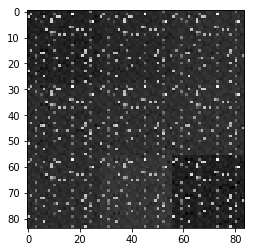

Batch 408


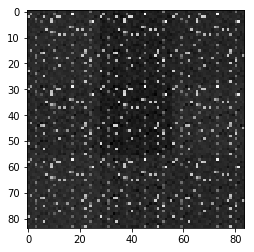

Batch 409


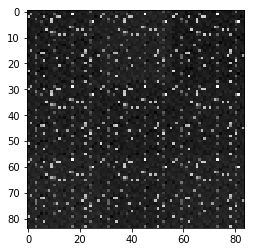

Batch 410


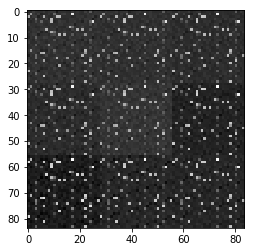

Batch 411


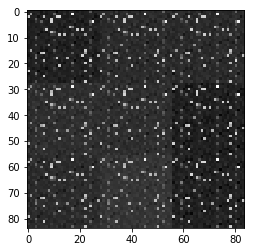

Batch 412


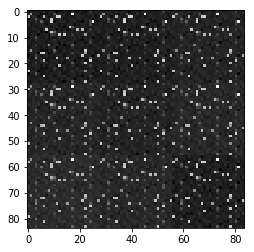

Batch 413


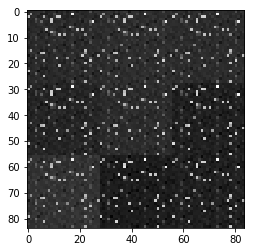

Batch 414


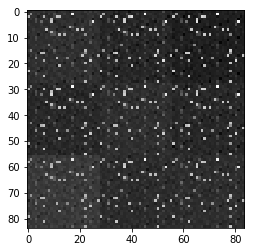

Batch 415


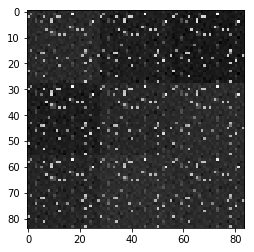

Batch 416


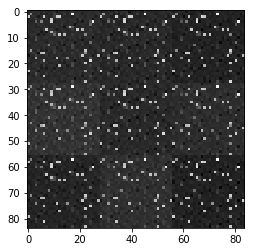

Batch 417


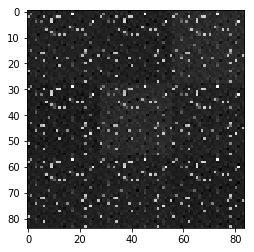

Batch 418


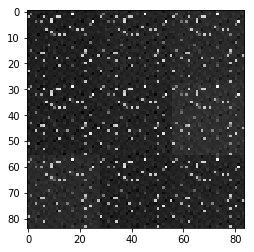

Batch 419


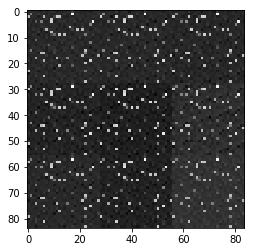

Batch 420


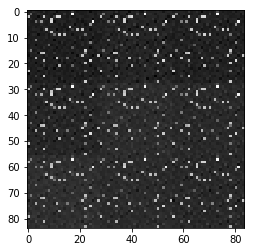

Batch 421


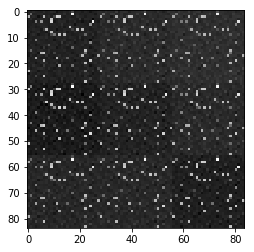

Batch 422


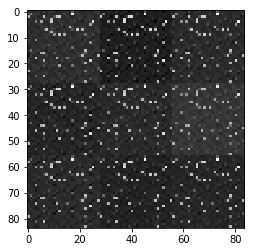

Batch 423


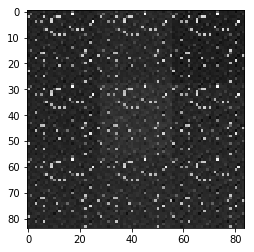

Batch 424


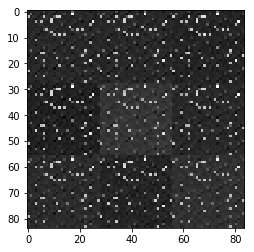

Batch 425


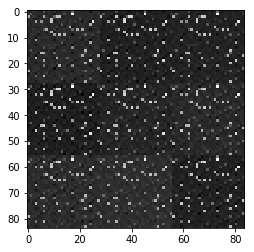

Batch 426


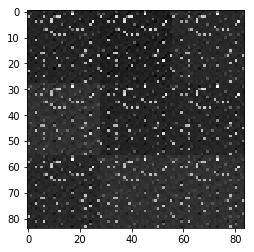

Batch 427


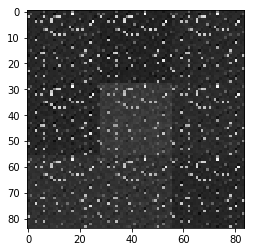

Batch 428


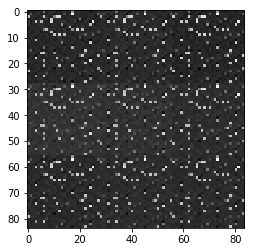

Batch 429


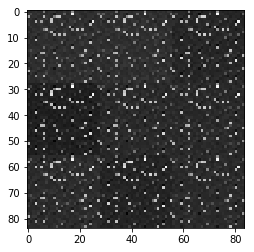

Batch 430


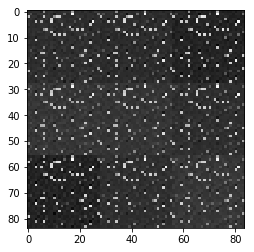

Batch 431


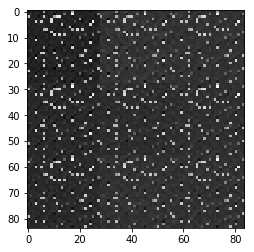

Batch 432


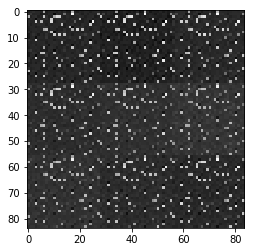

Batch 433


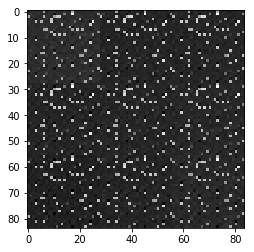

Batch 434


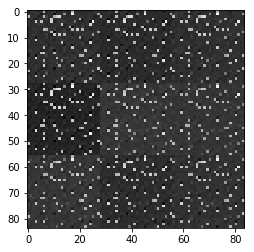

Batch 435


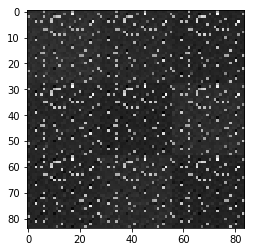

Batch 436


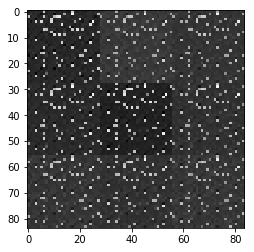

Batch 437


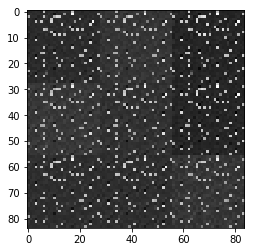

Batch 438


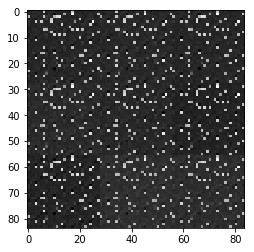

Batch 439


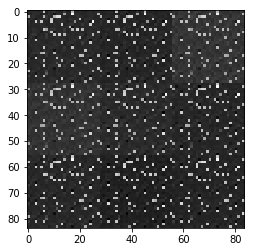

Batch 440


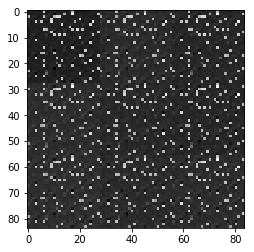

Batch 441


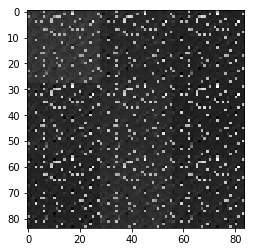

Batch 442


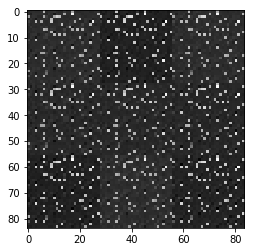

Batch 443


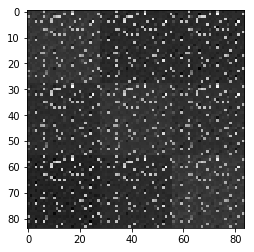

Batch 444


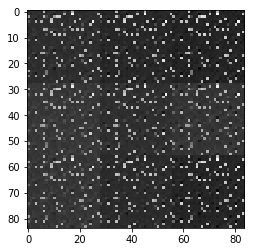

Batch 445


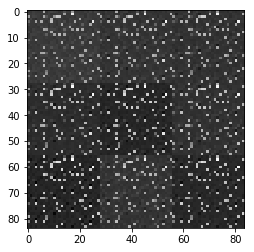

Batch 446


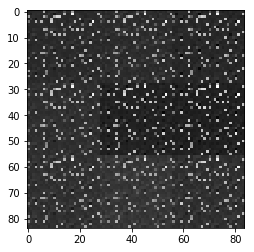

Batch 447


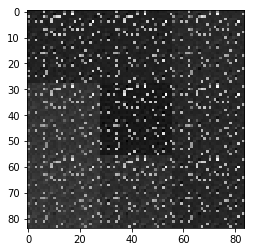

Batch 448


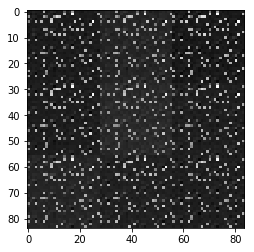

Batch 449


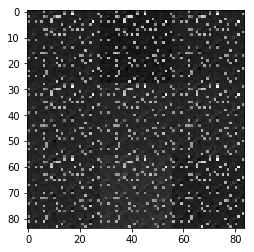

Batch 450


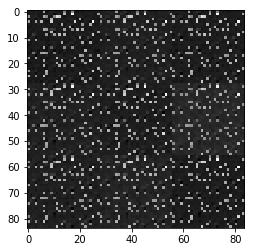

Batch 451


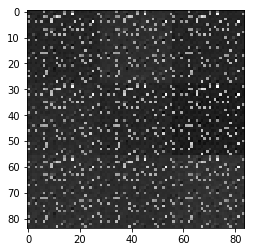

Batch 452


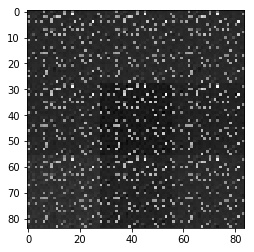

Batch 453


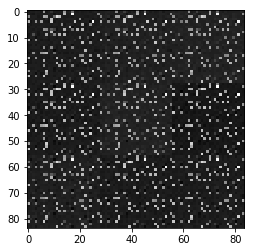

Batch 454


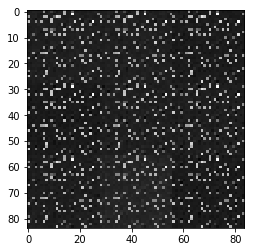

Batch 455


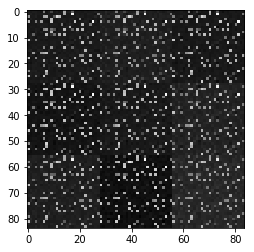

Batch 456


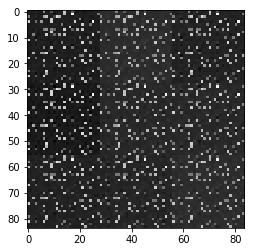

Batch 457


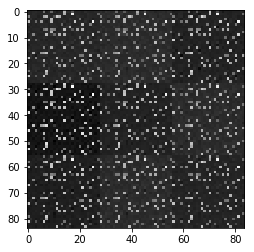

Batch 458


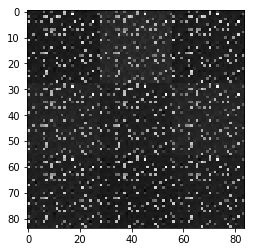

Batch 459


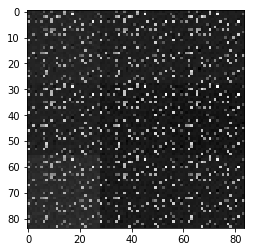

Batch 460


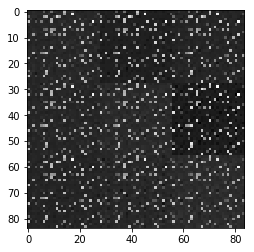

Batch 461


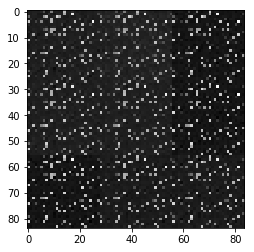

Batch 462


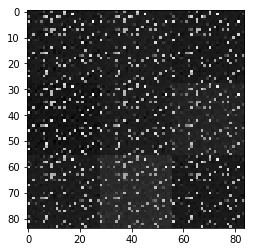

Batch 463


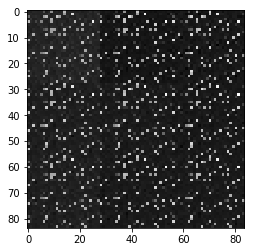

Batch 464


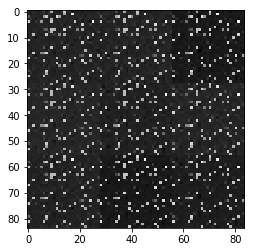

Batch 465


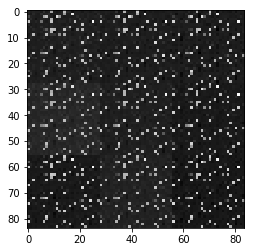

Batch 466


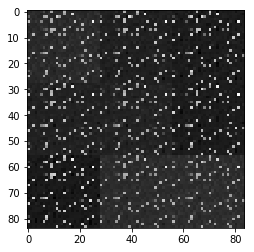

Batch 467


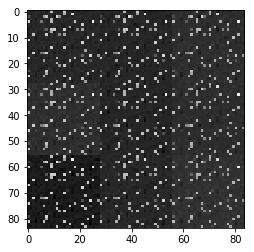

Batch 468


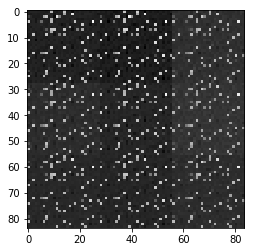

Batch 469


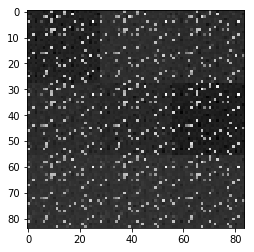

Batch 470


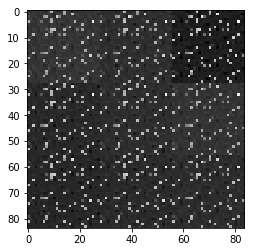

Batch 471


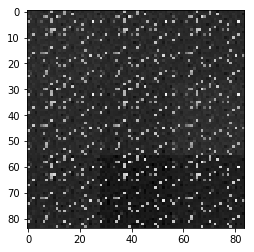

Batch 472


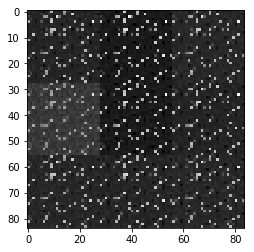

Batch 473


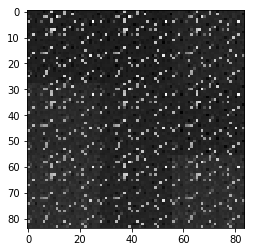

Batch 474


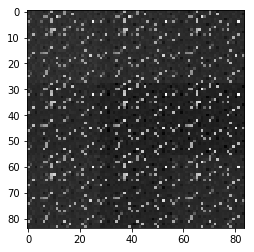

Batch 475


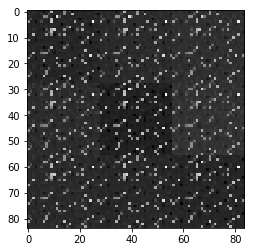

Batch 476


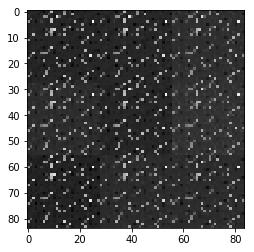

Batch 477


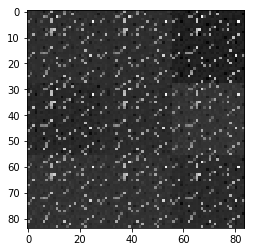

Batch 478


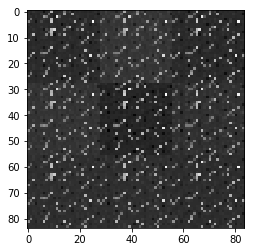

Batch 479


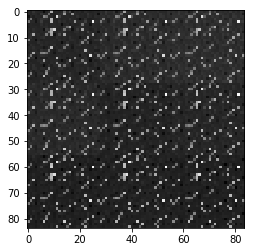

Batch 480


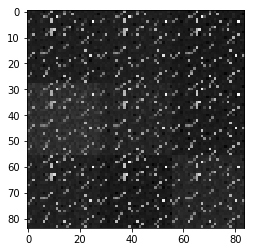

Batch 481


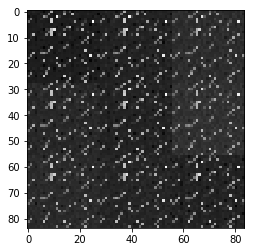

Batch 482


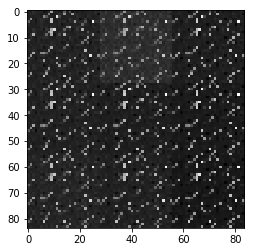

Batch 483


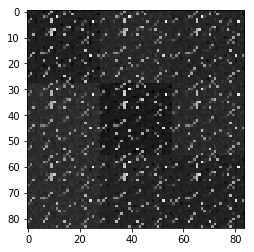

Batch 484


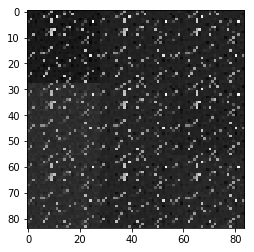

Batch 485


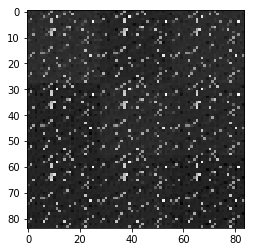

Batch 486


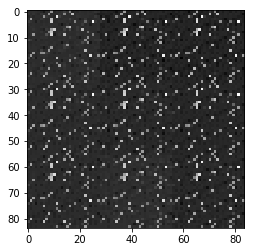

Batch 487


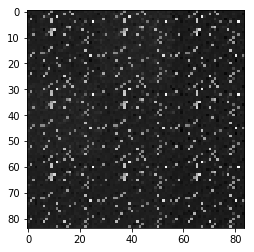

Batch 488


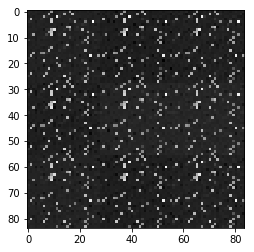

Batch 489


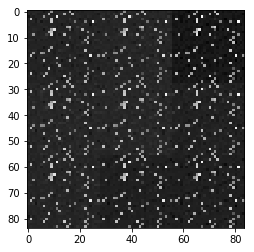

Batch 490


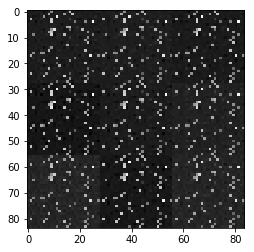

Batch 491


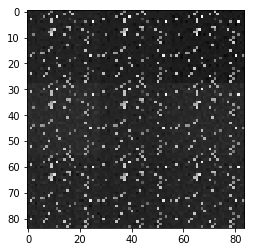

Batch 492


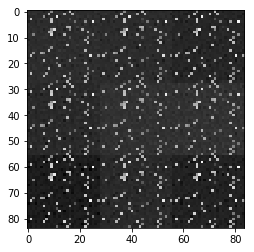

Batch 493


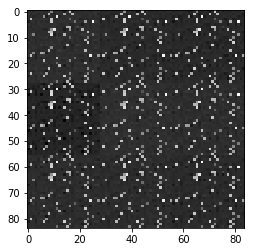

Batch 494


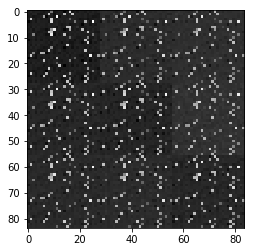

Batch 495


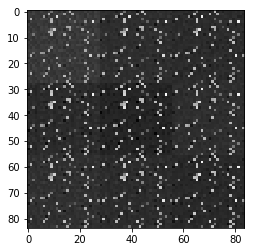

Batch 496


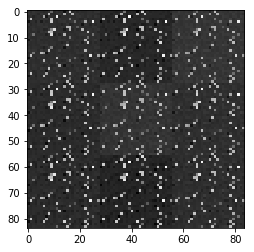

Batch 497


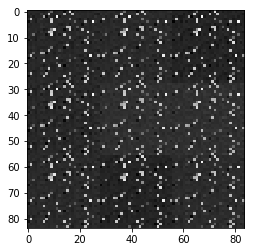

Batch 498


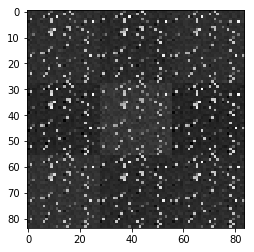

Batch 499


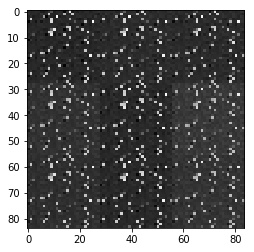

Batch 500


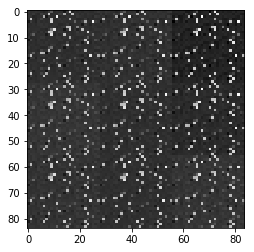

Batch 501


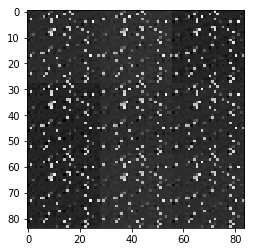

Batch 502


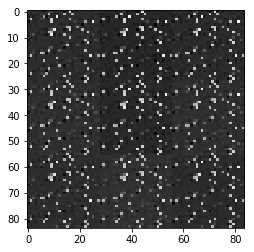

Batch 503


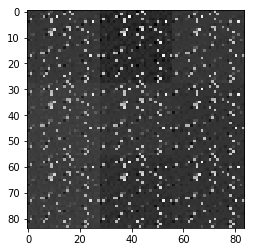

Batch 504


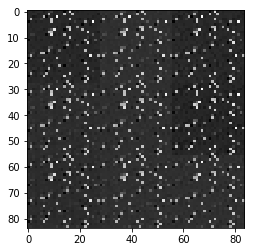

Batch 505


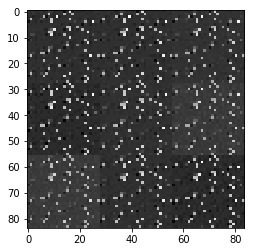

Batch 506


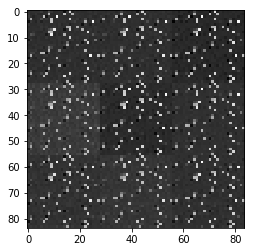

Batch 507


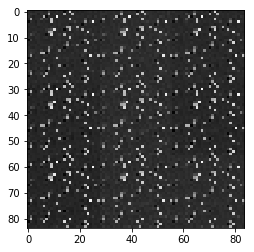

Batch 508


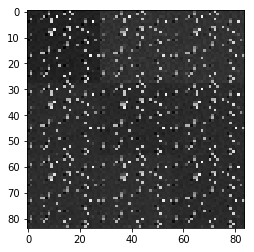

Batch 509


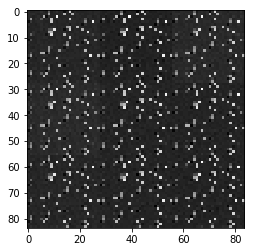

Batch 510


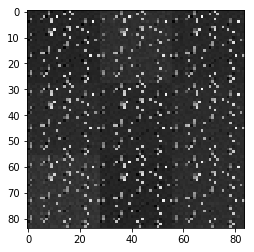

Batch 511


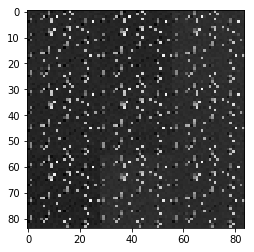

Batch 512


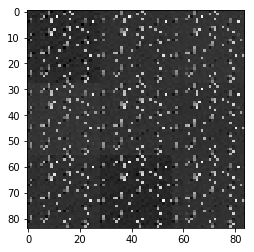

Batch 513


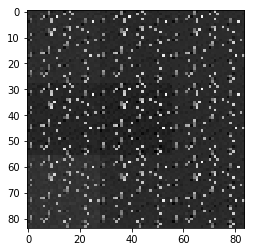

Batch 514


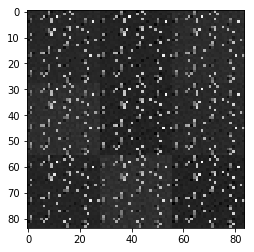

Batch 515


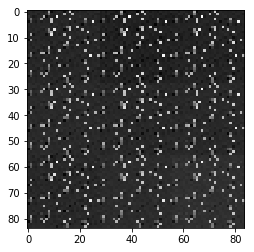

Batch 516


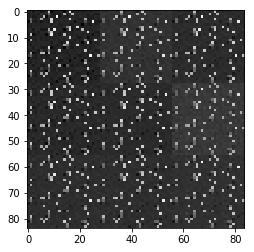

Batch 517


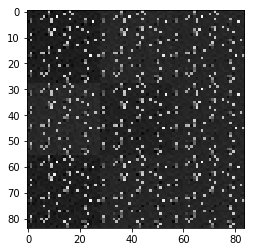

Batch 518


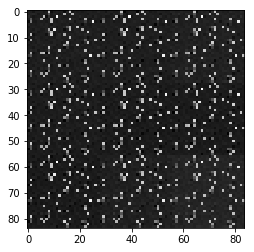

Batch 519


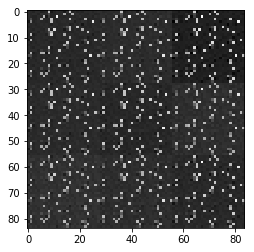

Batch 520


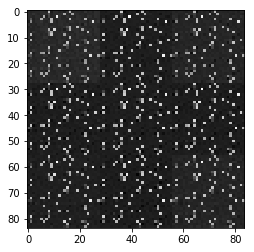

Batch 521


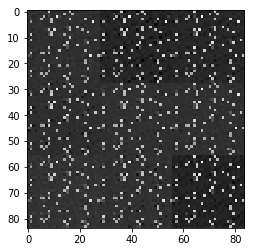

Batch 522


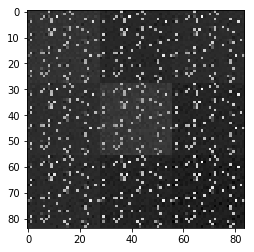

Batch 523


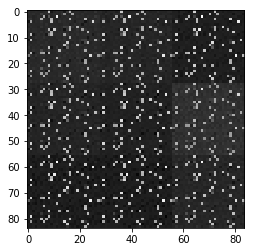

Batch 524


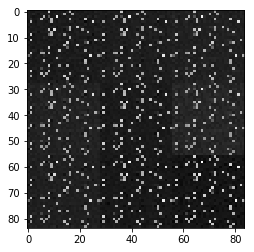

Batch 525


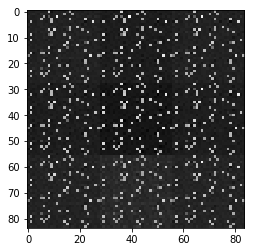

Batch 526


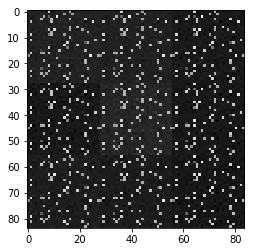

Batch 527


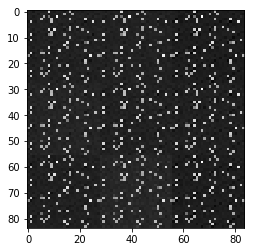

Batch 528


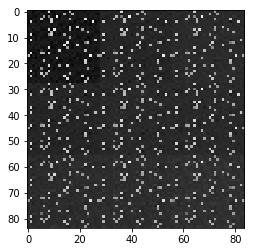

Batch 529


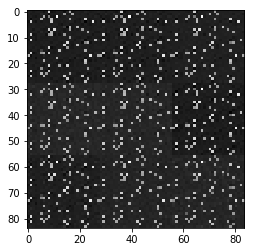

Batch 530


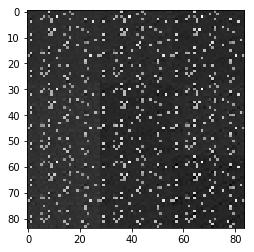

Batch 531


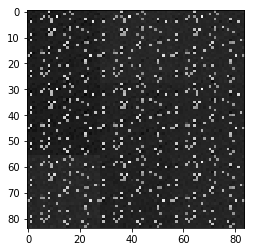

Batch 532


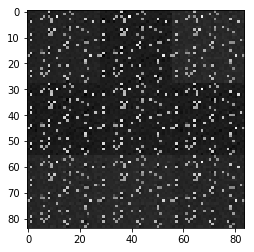

Batch 533


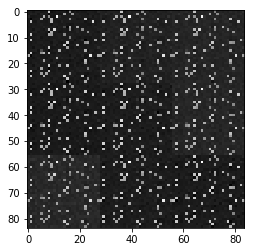

Batch 534


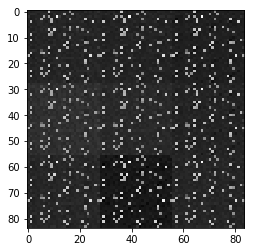

Batch 535


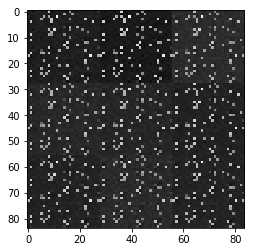

Batch 536


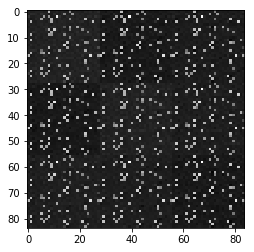

Batch 537


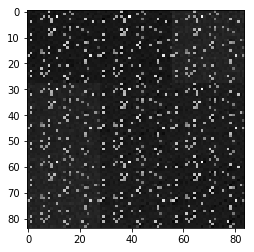

Batch 538


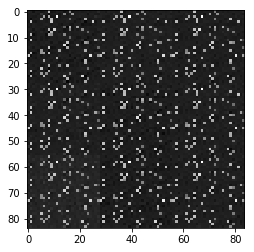

Batch 539


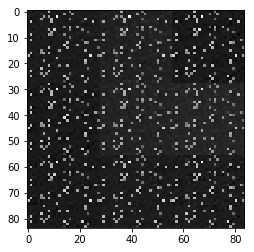

Batch 540


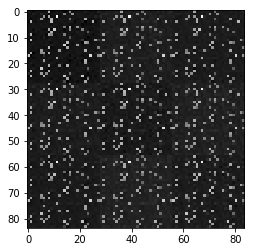

Batch 541


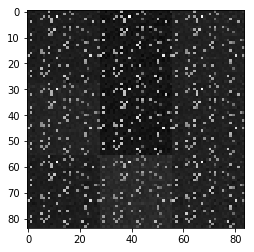

Batch 542


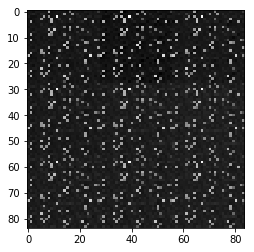

Batch 543


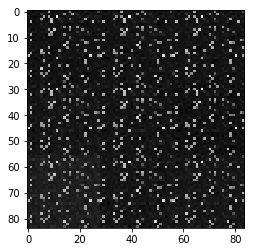

Batch 544


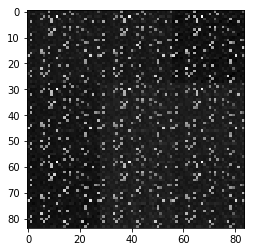

Batch 545


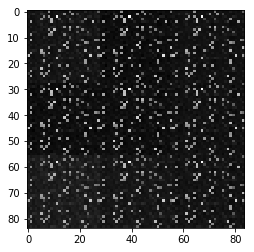

Batch 546


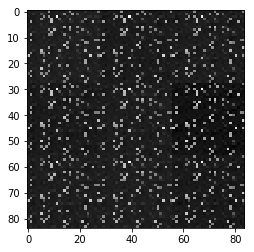

Batch 547


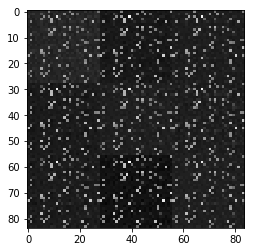

Batch 548


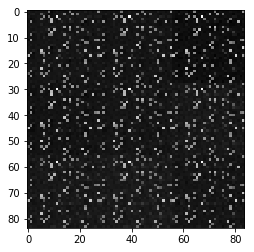

Batch 549


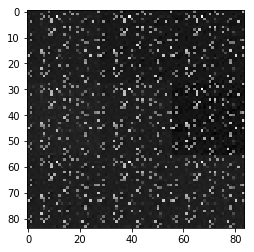

Batch 550


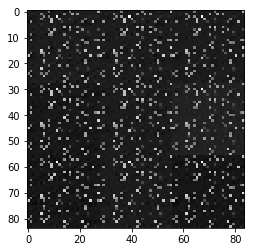

Batch 551


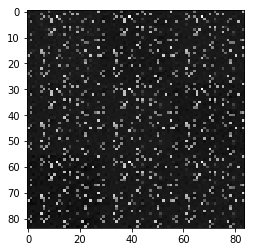

Batch 552


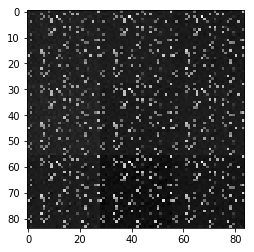

Batch 553


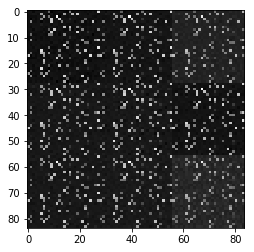

Batch 554


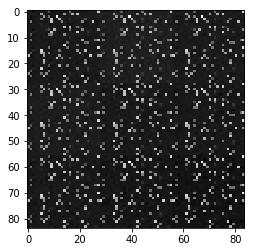

Batch 555


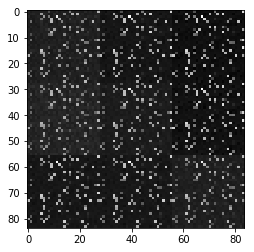

Batch 556


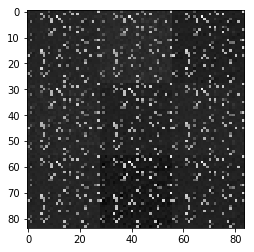

Batch 557


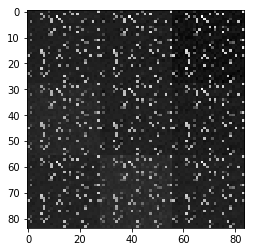

Batch 558


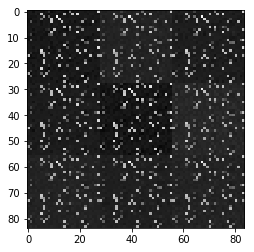

Batch 559


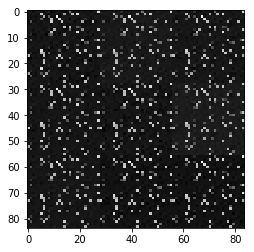

Batch 560


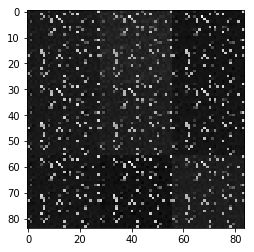

Batch 561


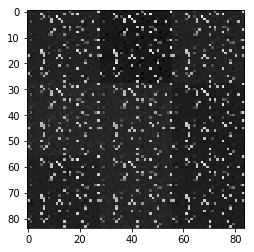

Batch 562


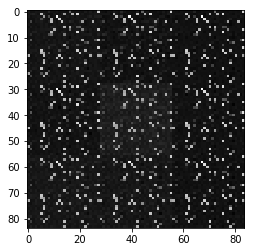

Batch 563


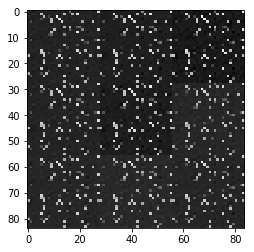

Batch 564


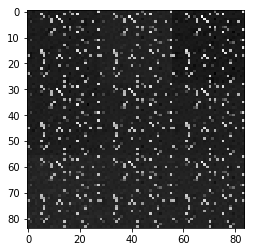

Batch 565


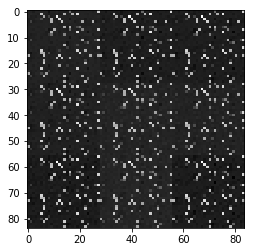

Batch 566


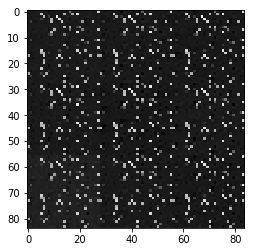

Batch 567


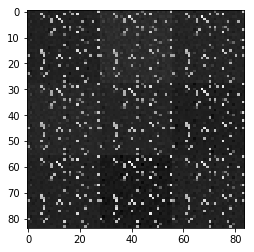

Batch 568


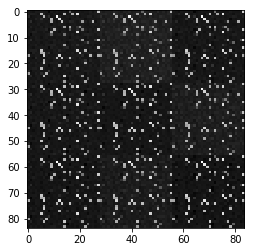

Batch 569


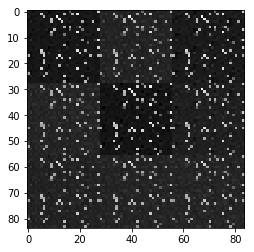

Batch 570


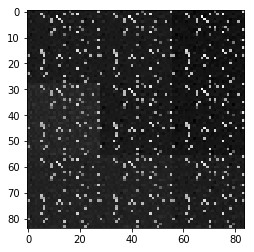

Batch 571


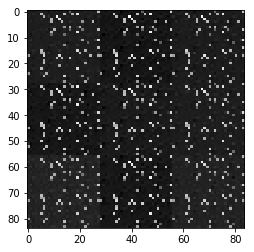

Batch 572


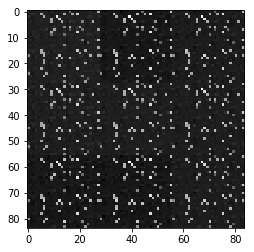

Batch 573


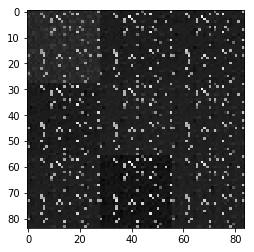

Batch 574


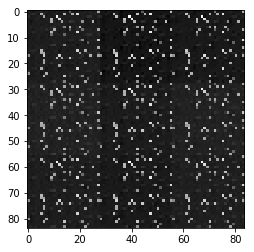

Batch 575


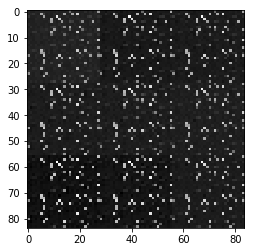

Batch 576


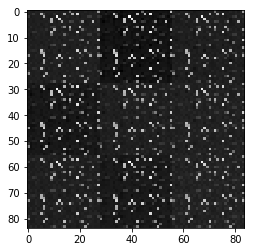

Batch 577


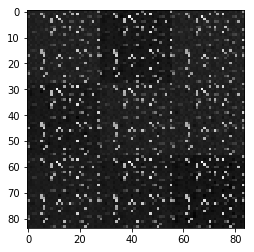

Batch 578


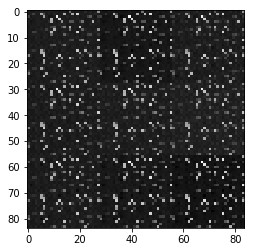

Batch 579


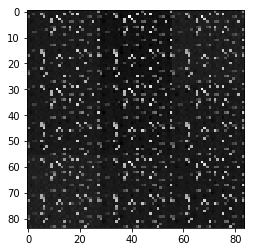

Batch 580


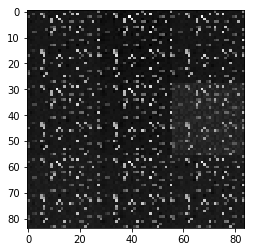

Batch 581


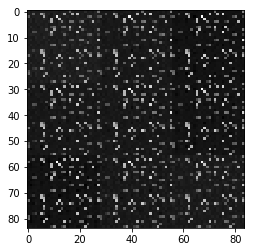

Batch 582


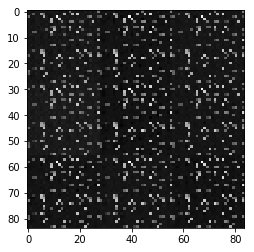

Batch 583


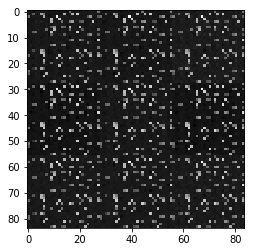

Batch 584


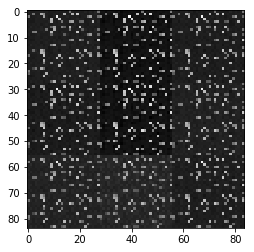

Batch 585


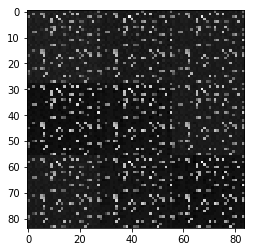

Batch 586


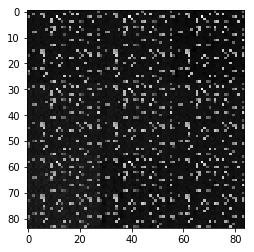

Batch 587


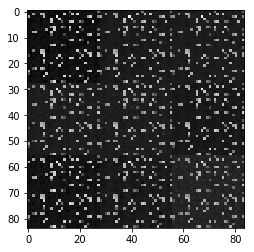

Batch 588


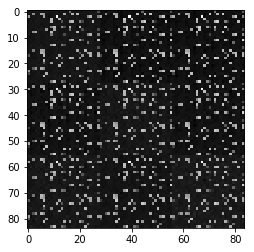

Batch 589


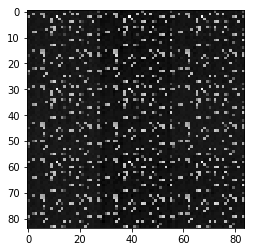

Batch 590


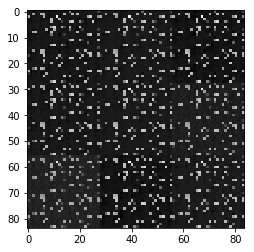

Batch 591


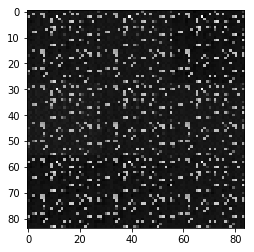

Batch 592


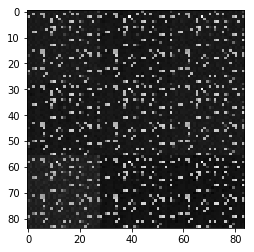

Batch 593


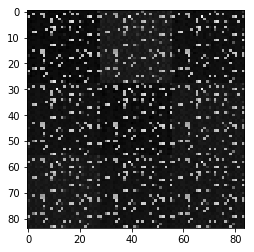

Batch 594


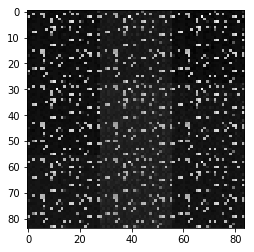

Batch 595


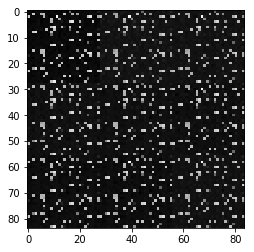

Batch 596


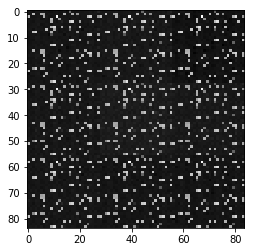

Batch 597


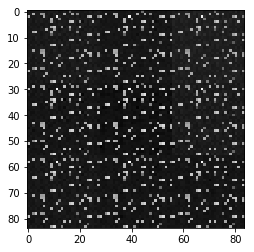

Batch 598


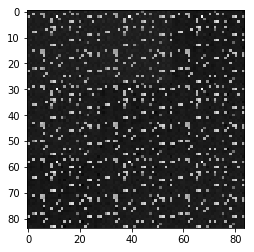

Batch 599


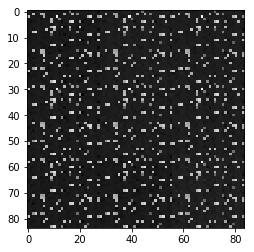

Batch 0


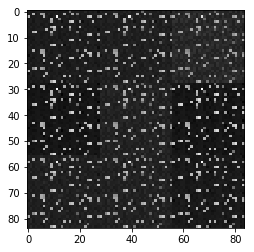

Batch 1


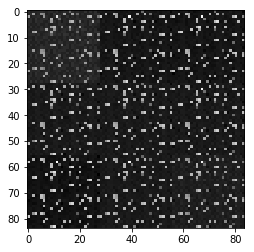

Batch 2


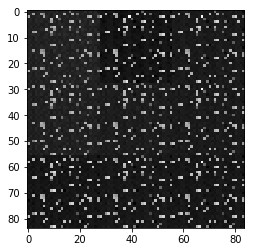

Batch 3


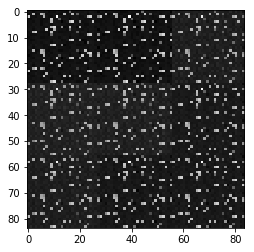

Batch 4


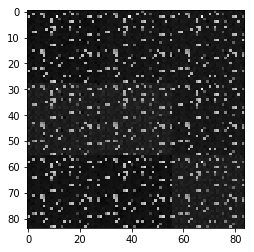

Batch 5


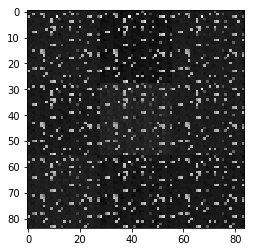

Batch 6


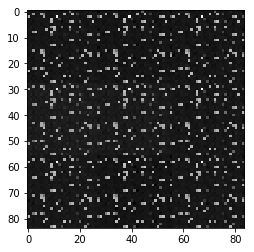

Batch 7


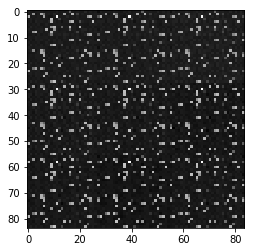

Batch 8


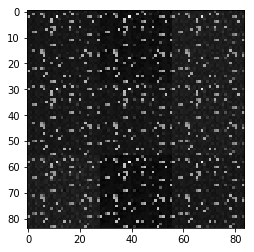

Batch 9


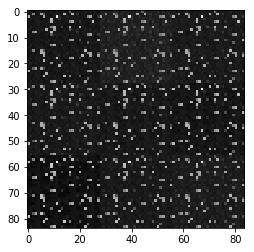

Batch 10


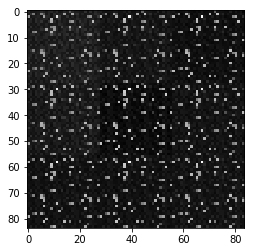

Batch 11


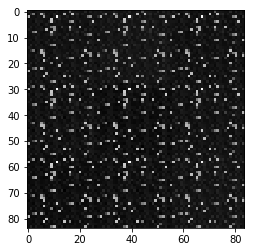

Batch 12


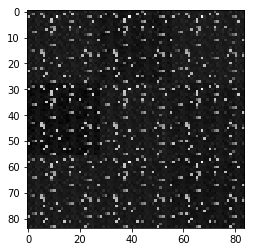

Batch 13


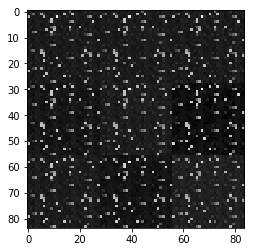

Batch 14


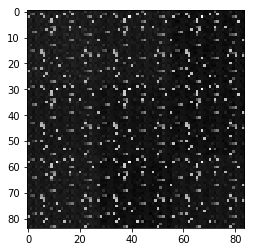

Batch 15


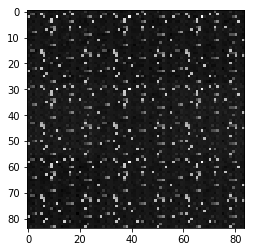

Batch 16


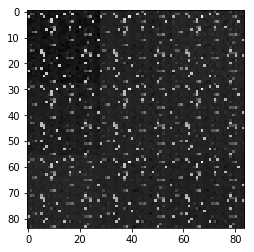

Batch 17


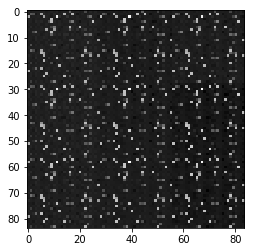

Batch 18


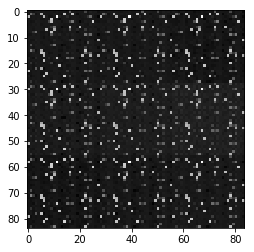

Batch 19


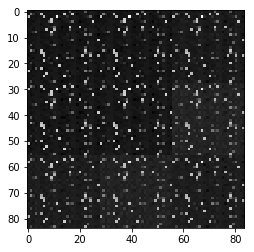

Batch 20


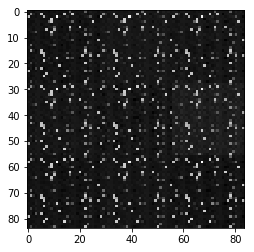

Batch 21


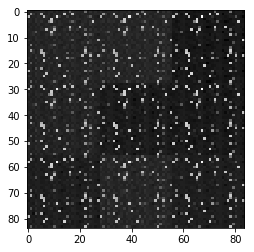

Batch 22


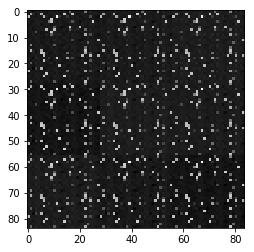

Batch 23


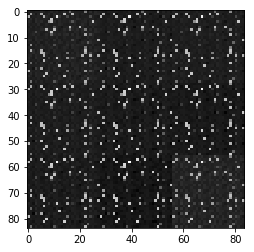

Batch 24


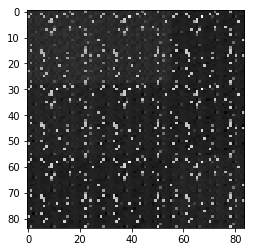

Batch 25


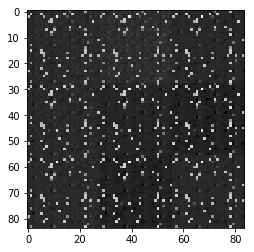

Batch 26


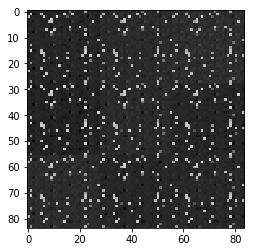

Batch 27


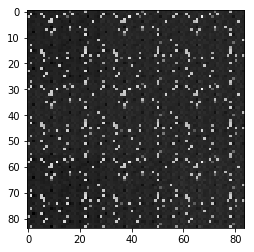

Batch 28


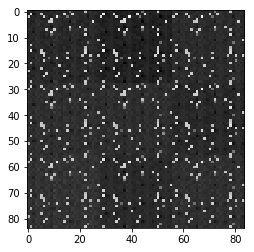

Batch 29


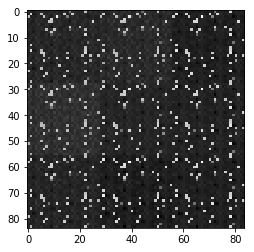

Batch 30


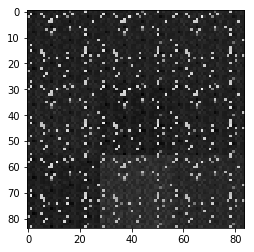

Batch 31


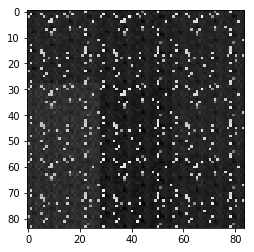

Batch 32


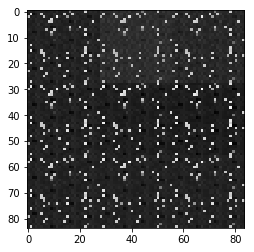

Batch 33


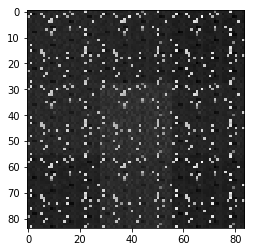

Batch 34


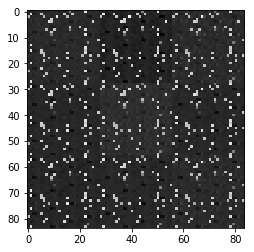

Batch 35


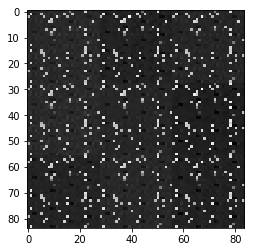

Batch 36


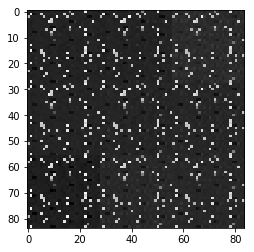

Batch 37


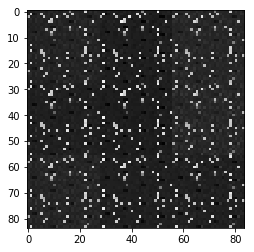

Batch 38


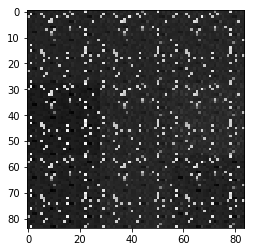

Batch 39


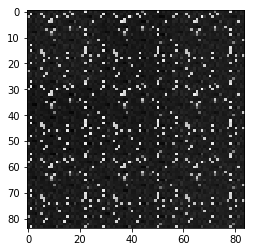

Batch 40


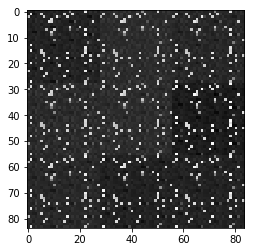

Batch 41


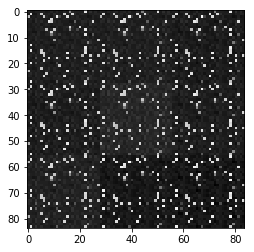

Batch 42


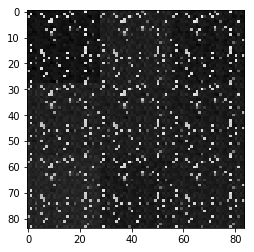

Batch 43


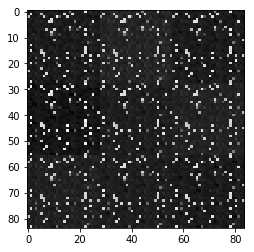

Batch 44


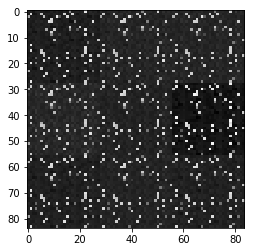

Batch 45


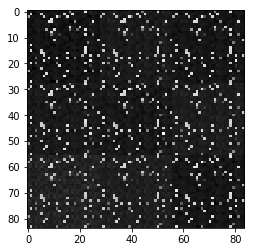

Batch 46


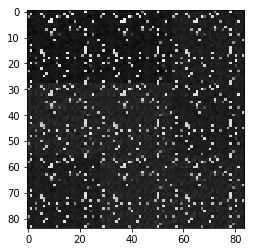

Batch 47


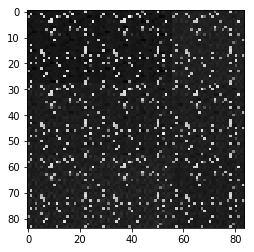

Batch 48


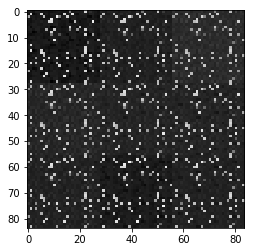

Batch 49


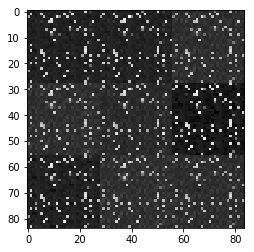

Batch 50


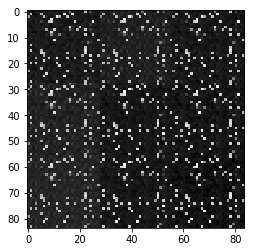

Batch 51


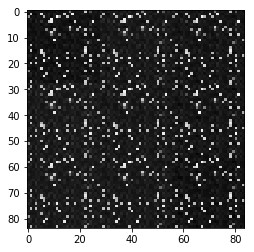

Batch 52


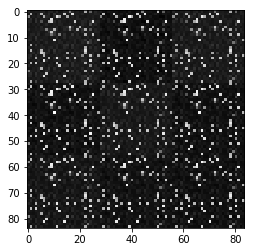

Batch 53


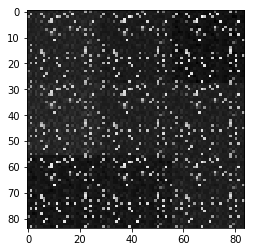

Batch 54


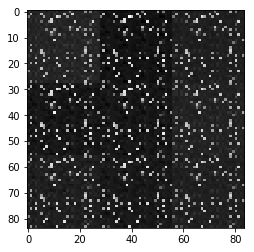

Batch 55


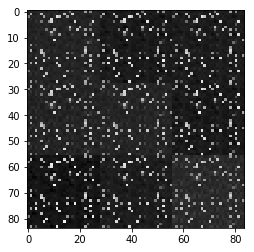

Batch 56


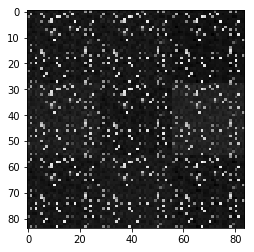

Batch 57


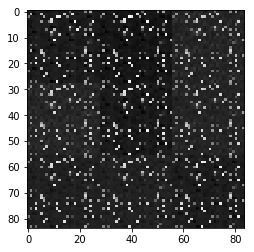

Batch 58


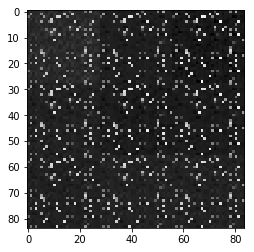

Batch 59


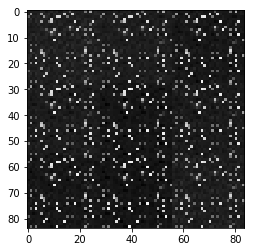

Batch 60


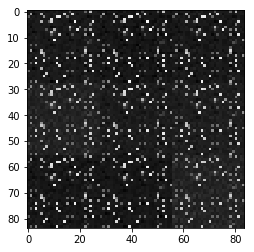

Batch 61


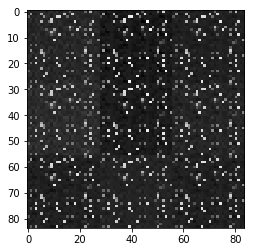

Batch 62


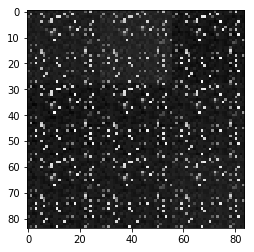

Batch 63


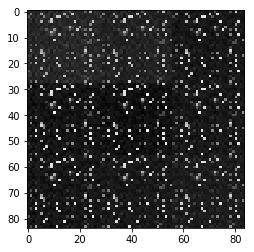

Batch 64


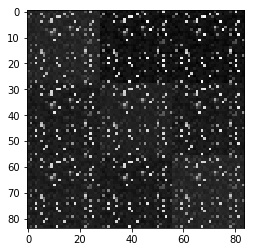

Batch 65


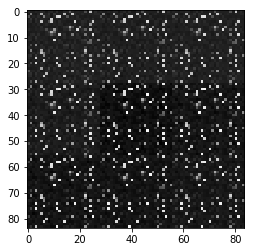

Batch 66


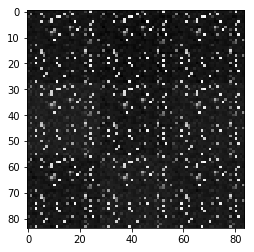

Batch 67


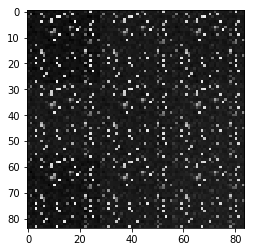

Batch 68


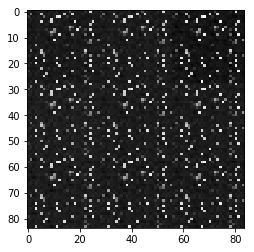

Batch 69


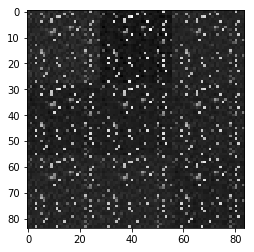

Batch 70


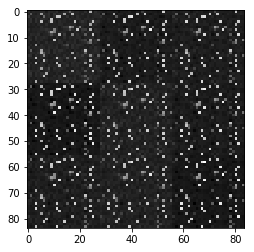

Batch 71


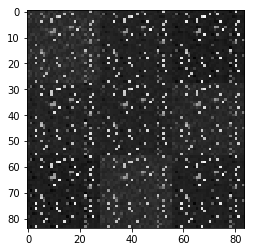

Batch 72


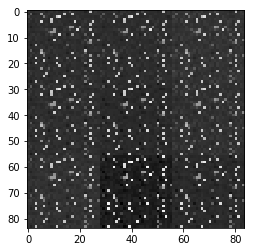

Batch 73


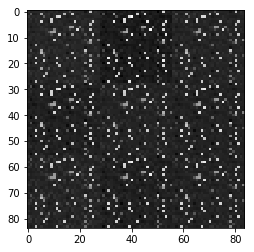

Batch 74


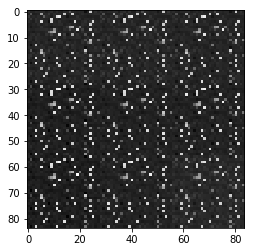

Batch 75


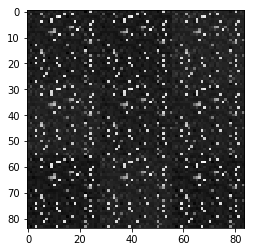

Batch 76


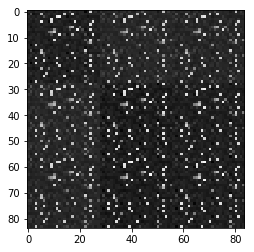

Batch 77


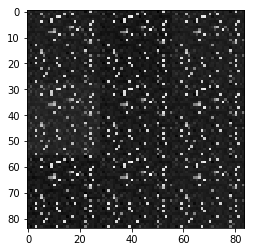

Batch 78


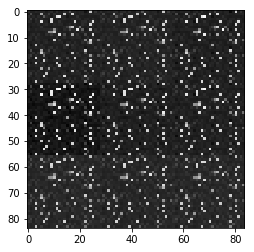

Batch 79


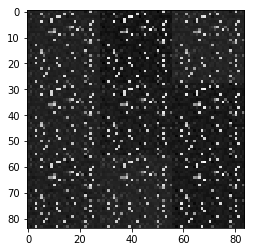

Batch 80


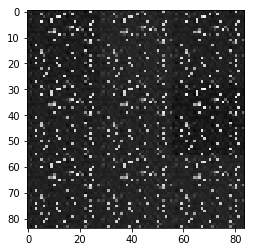

Batch 81


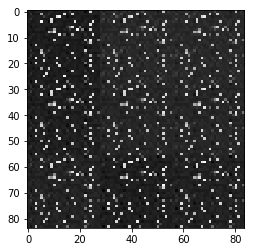

Batch 82


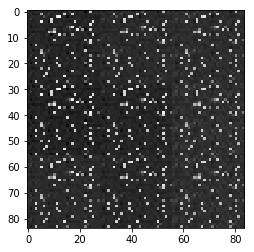

Batch 83


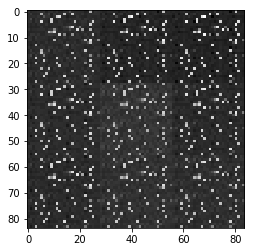

Batch 84


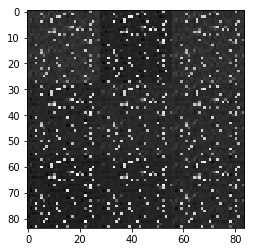

Batch 85


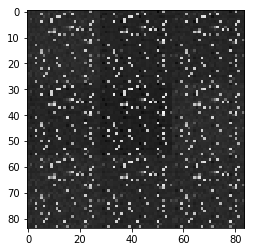

Batch 86


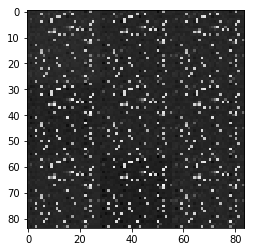

Batch 87


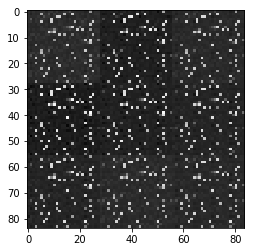

Batch 88


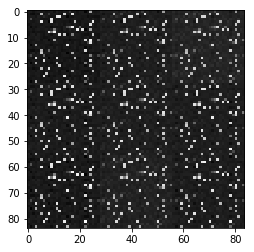

Batch 89


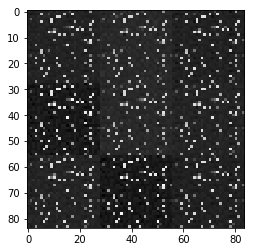

Batch 90


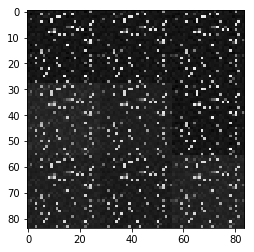

Batch 91


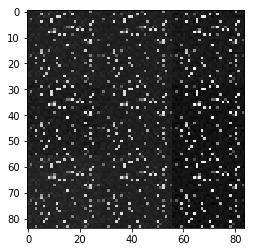

Batch 92


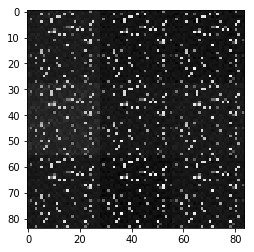

Batch 93


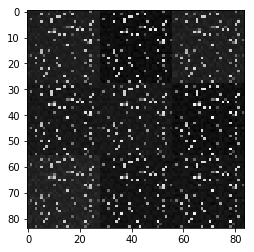

Batch 94


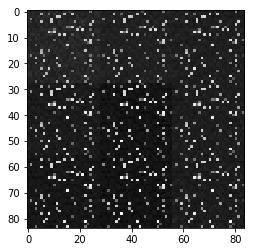

Batch 95


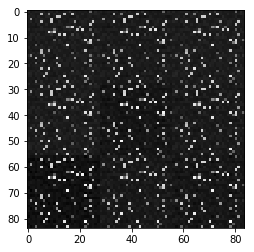

Batch 96


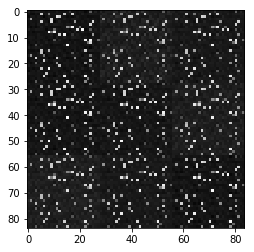

Batch 97


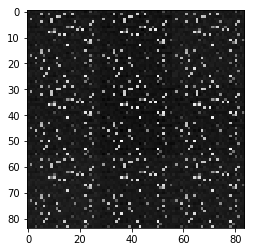

Batch 98


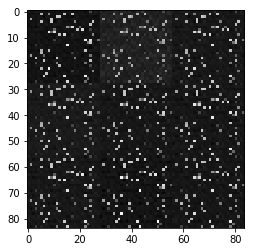

Batch 99


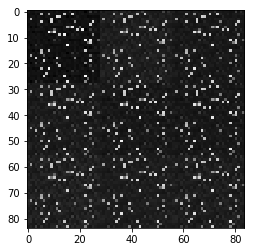

Batch 100


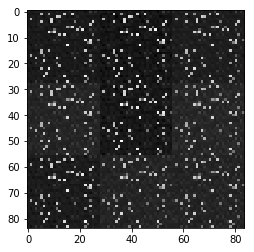

Batch 101


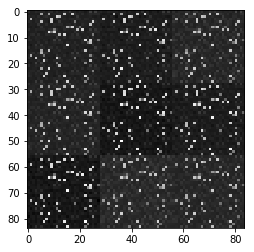

Batch 102


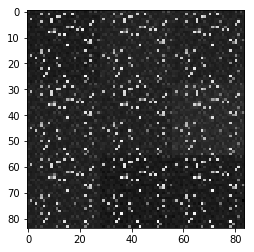

Batch 103


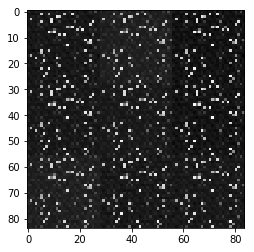

Batch 104


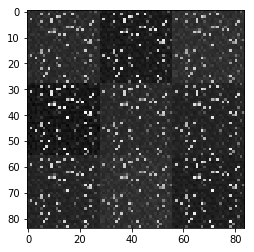

Batch 105


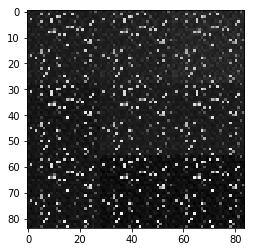

Batch 106


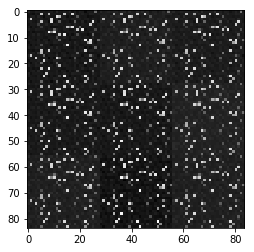

Batch 107


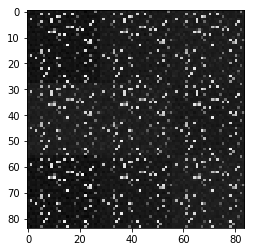

KeyboardInterrupt: 

In [12]:
batch_size = 100
z_dim = 100
learning_rate = 0.002
beta1 = 0.75


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

In [ ]:
batch_size = None
z_dim = None
learning_rate = None
beta1 = None


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.